# **Preprocessing (Data Exploration)**

In [ ]:
pip install mpimg

  Preparing metadata (setup.py) ... done
  Created wheel for mpimg: filename=mpimg-0.0.1-py3-none-any.whl size=1328 sha256=c56701f90e134b77f18c2a14e8e2958ee8ba3f1a41be7927a720b14df853130a
  Stored in directory: /root/.cache/pip/wheels/c7/7e/9a/09d0090d5f2b5b579f27600ce86b02dac5f6e263a0f5395370
Successfully built mpimg


Importing Required Modules

In [ ]:
import os
import cv2
import shutil
import mpimg
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from PIL import Image, ImageFilter
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


  This defines the directory path for the fracture image dataset and retrieves the class names associated with the images.

Why is this done?

- This code helps verifing the directory path and identify the class names (or folder names) corresponding to the fracture image dataset.
- It can be useful for initial exploration and understanding the organization of the data.
- By analyzing the printed class names, it can confirm that the directory structure reflects the fracture types present in the dataset.

In [ ]:
dir_path = '/content/drive/MyDrive/Dataset'

# Get list of image file names in the directory
file_names = os.listdir(dir_path)

print("The classes of fracture:")
for i in range(len(file_names)):
    print(i+1,file_names[i])

The classes of fracture:
1 Longitudinal Fracture
2 Fracture Dislocation
3 Spiral Fracture
4 Intra-articular Fracture
5 Oblique Fracture
6 Pathological Fracture
7 Impacted Fracture
8 Comminuted fracture
9 Greenstick Fracture
10 Avulsion Fracture
11 Compression fracture


 This iterates through subdirectories in the fracture image dataset and gathers the sizes of all images within each subdirectory.

why is this done?

- NumPy arrays are specifically designed for numerical data in Python. They offer significant performance advantages over regular Python lists when performing mathematical operations or data analysis on large datasets.
- NumPy arrays allow vectorized operations, meaning you can apply the same operation to all elements of the array simultaneously. This can be much faster than looping through a list and performing calculations on each element individually.
- Many popular data analysis libraries in Python, like pandas and scikit-image, are built to work seamlessly with NumPy arrays. This makes it easier to perform calculations, visualizations, and statistical analysis on the image size data.

In [ ]:
dir_path = '/content/drive/MyDrive/Dataset'

# Get list of subdirectory names in the main directory
subdir_names = os.listdir(dir_path)

# Loop through each subdirectory and plot sizes of all images in that directory
for i, subdir_name in enumerate(subdir_names):
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)

    # Initialize empty lists to store sizes of images in this class
    image_sizes = []
    for file_name in file_names:
        image_path = os.path.join(subdir_path, file_name)
        if os.path.isfile(image_path) and os.path.splitext(image_path)[1].lower() in ['.png', '.jpg', '.jpeg', '.gif']:
            with Image.open(image_path) as img:
                size = img.size
                image_sizes.append(size)

    # Convert image sizes to numpy array
    image_sizes = np.array(image_sizes)

Maximize Image Size

Finds the image with the largest width or height (whichever is larger) from a collection of images represented by their width and height dimensions.

why is this done?

- Identify largest image for processing.
- Layout considerations.
- Resizing or cropping.
- Filtering based on size.

In [ ]:
# Find maximum image size
max_size = max(image_sizes, key=lambda x: max(x))
print("Maximum image size:", max_size)

Maximum image size: [3000 2173]


## Scatter Plot for Image Dimensions

This visualizes the distribution of image sizes in the data, helping in gaining insights into the range and potential relationships between width and height.

why is this done?

- By separating the explanation into smaller chunks, it pave the way to focus on each step individually. This can be particularly helpful when dealing with code that involves multiple functionalities.

- Shorter points tend to be more concise and easier to grasp. Key concepts are presented directly, avoiding unnecessary conversational elements.

- When revisiting the explanation later, it's easier to find specific details.

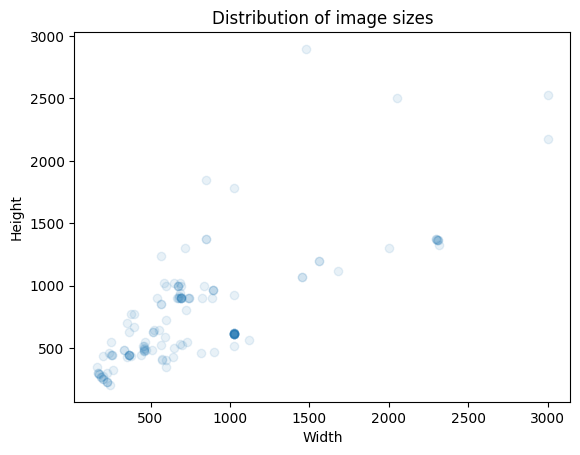

In [ ]:
# Plot scatter plot of image sizes
fig, ax = plt.subplots()
ax.scatter(image_sizes[:, 0], image_sizes[:, 1], alpha=0.1)
ax.set_xlabel('Width')
ax.set_ylabel('Height')
ax.set_title('Distribution of image sizes')
plt.show()

Checking Number of Images less than 2000x2000

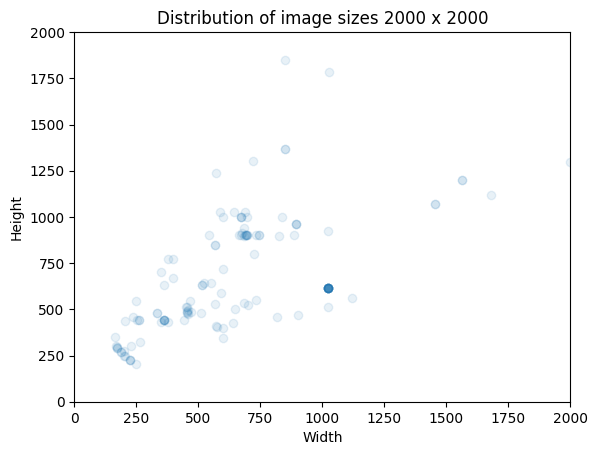

In [ ]:
fig, ax = plt.subplots()
ax.scatter(image_sizes[:, 0], image_sizes[:, 1], alpha=0.1)
ax.set_xlabel('Width')
ax.set_ylabel('Height')
ax.set_title('Distribution of image sizes 2000 x 2000')
ax.set_xlim(0, 2000)
ax.set_ylim(0, 2000)
plt.show()

Checking Images lesser than 500x500

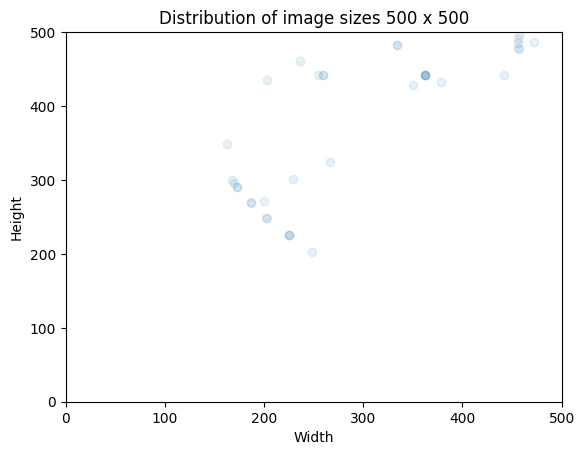

In [ ]:
fig, ax = plt.subplots()
ax.scatter(image_sizes[:, 0], image_sizes[:, 1], alpha=0.1)
ax.set_xlabel('Width')
ax.set_ylabel('Height')
ax.set_title('Distribution of image sizes 500 x 500')
ax.set_xlim(0, 500)
ax.set_ylim(0, 500)
plt.show()

### Scatter Plot of Images for each class of images.

This iterates through each subdirectory within a larger directory, analyzes the image sizes within each subdirectory, and creates a separate scatter plot for each subdirectory.

why is this done?

- Images within a dataset might not all be the same size. This code help in visualize these variations across different subdirectories

- To process the images, knowing the size distribution can help optimize the workflow.

- To help identifing such anomalies, prompting to investigate the cause.

- Analyzing size distribution can be part of a broader data exploration process. By visualizing these variations, it might gain insights into the nature of the image dataset and potential relationships between image sizes and subdirectory categories.

Class Longitudinal Fracture has 140 images.


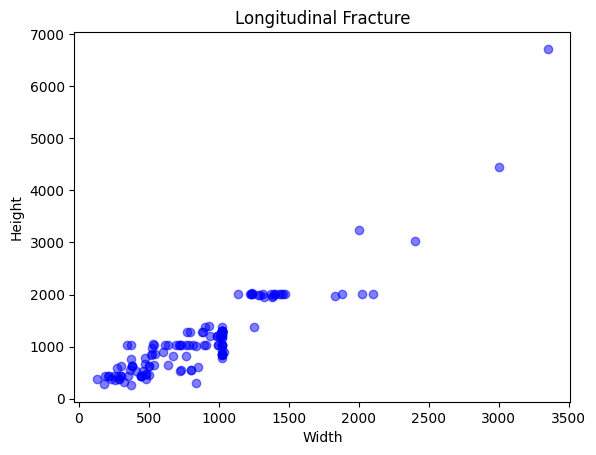

Class Fracture Dislocation has 140 images.


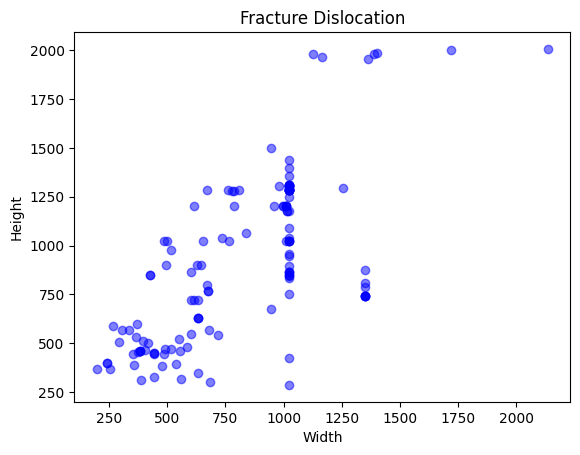

Class Spiral Fracture has 140 images.


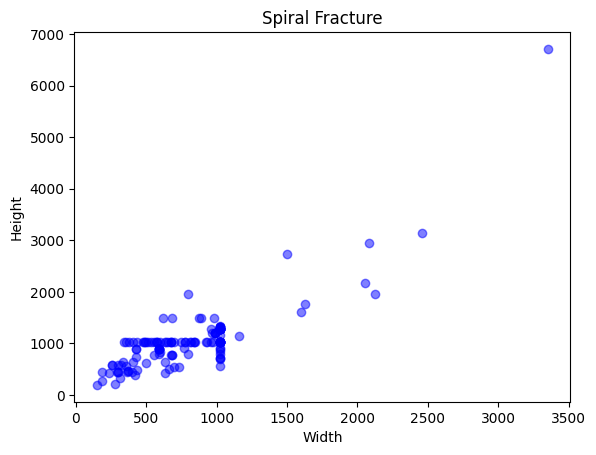

Class Intra-articular Fracture has 140 images.


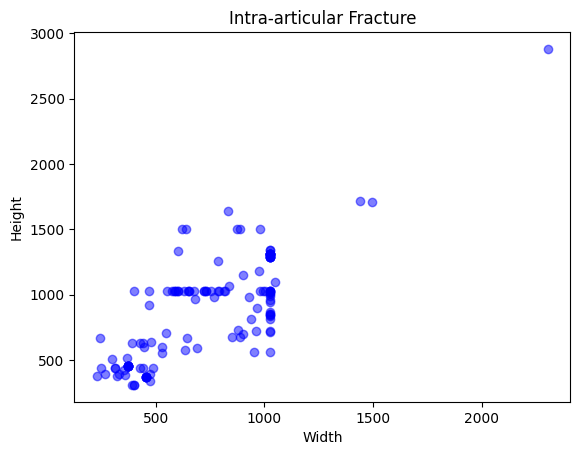

Class Oblique Fracture has 140 images.


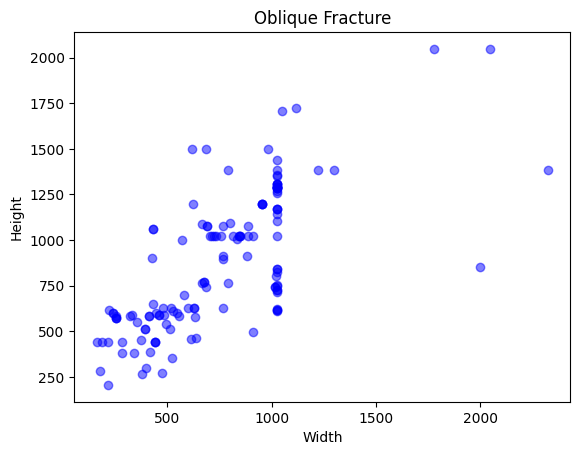

Class Pathological Fracture has 140 images.


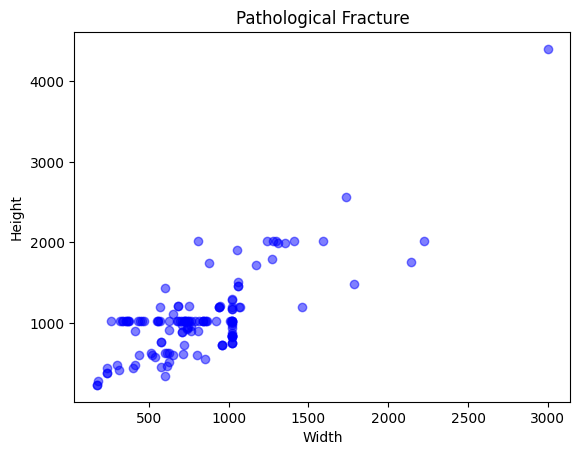

Class Impacted Fracture has 140 images.


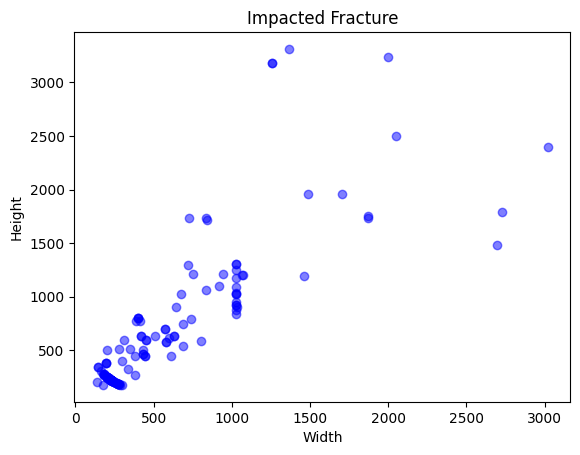

Class Comminuted fracture has 140 images.


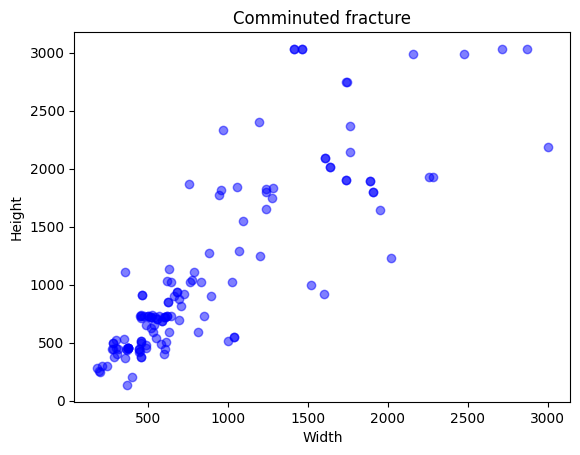

Class Greenstick Fracture has 140 images.


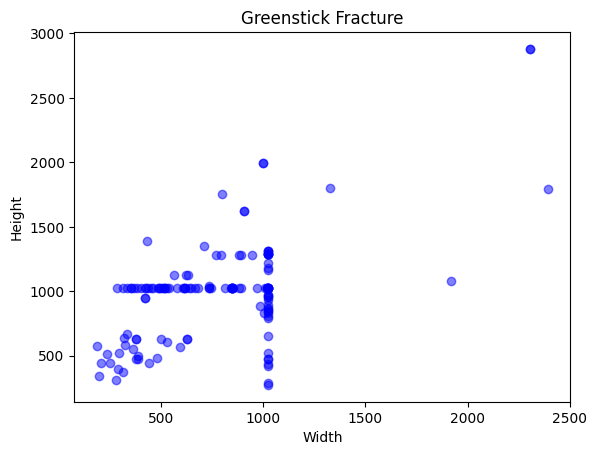

Class Avulsion Fracture has 140 images.


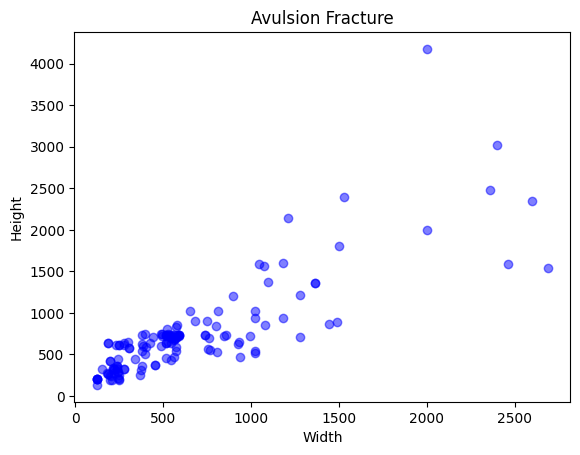

Class Compression fracture has 140 images.


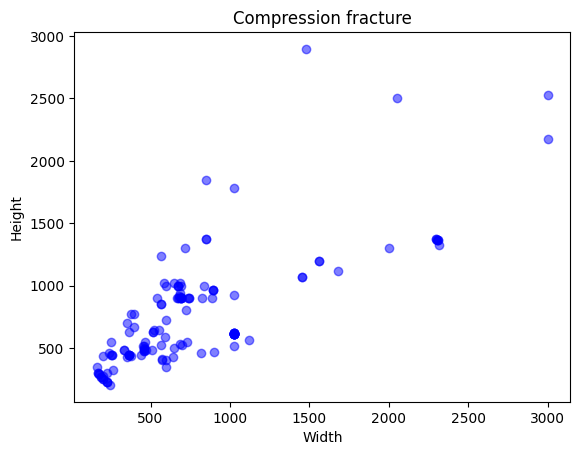

In [ ]:
# Loop through each subdirectory and plot sizes of all images in that directory
for i, subdir_name in enumerate(subdir_names):
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)

    # Initialize empty lists to store sizes of images in this class
    image_sizes = []
    for file_name in file_names:
        image_path = os.path.join(subdir_path, file_name)
        with Image.open(image_path) as img:
            size = img.size
            image_sizes.append(size)

    # Convert image sizes to numpy array
    image_sizes = np.array(image_sizes)

    # Plot scatter plot of image sizes for this class
    fig, ax = plt.subplots()
    ax.scatter(image_sizes[:, 0], image_sizes[:, 1], color='blue', alpha=0.5)
    ax.set_xlabel('Width')
    ax.set_ylabel('Height')
    ax.set_title(subdir_name)

    # Print number of images in this class
    num_images = len(image_sizes)
    print(f"Class {subdir_name} has {num_images} images.")

    plt.show()

Check Images of Size lesser that 2000x2000

Class Longitudinal Fracture has 119 images within 2000x2000 pixels.


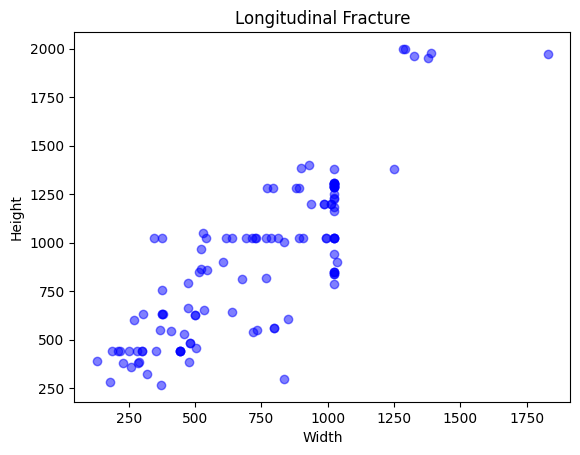

Class Fracture Dislocation has 138 images within 2000x2000 pixels.


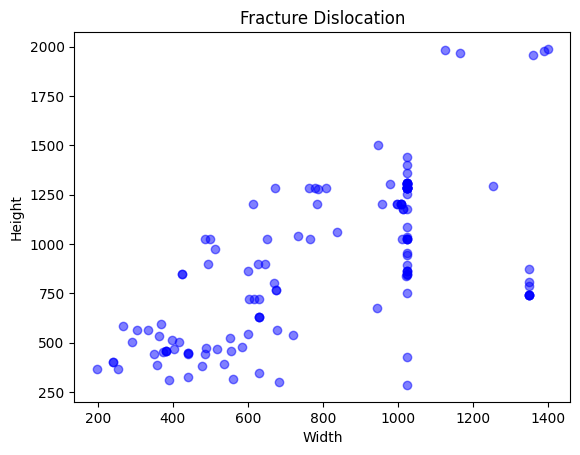

Class Spiral Fracture has 134 images within 2000x2000 pixels.


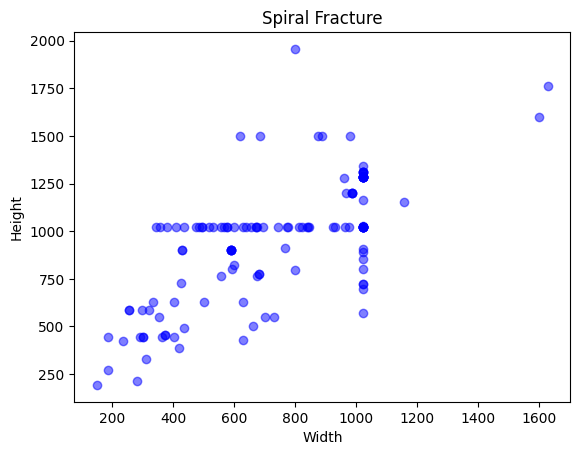

Class Intra-articular Fracture has 139 images within 2000x2000 pixels.


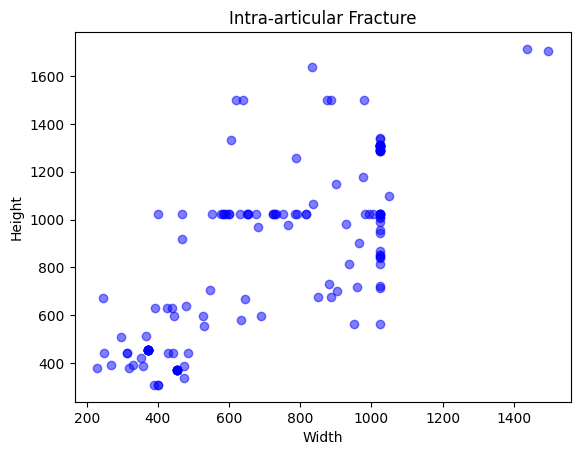

Class Oblique Fracture has 137 images within 2000x2000 pixels.


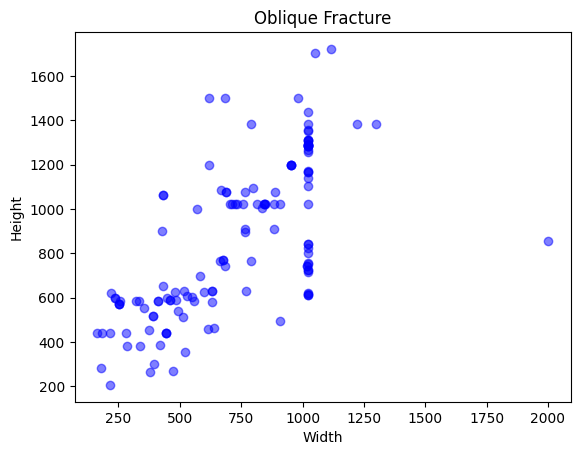

Class Pathological Fracture has 130 images within 2000x2000 pixels.


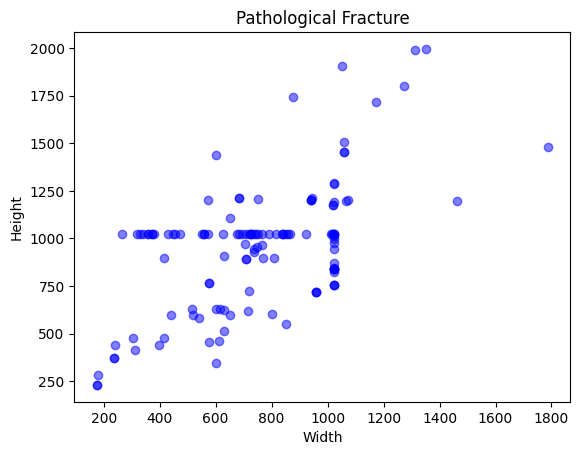

Class Impacted Fracture has 132 images within 2000x2000 pixels.


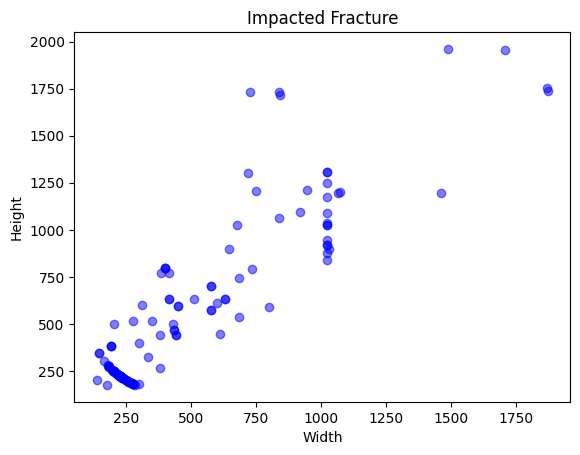

Class Comminuted fracture has 118 images within 2000x2000 pixels.


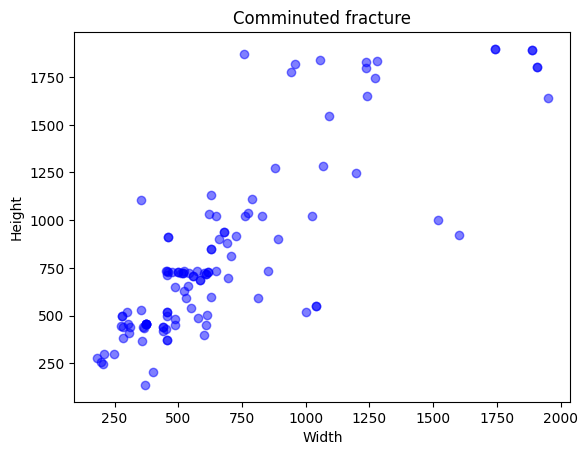

Class Greenstick Fracture has 137 images within 2000x2000 pixels.


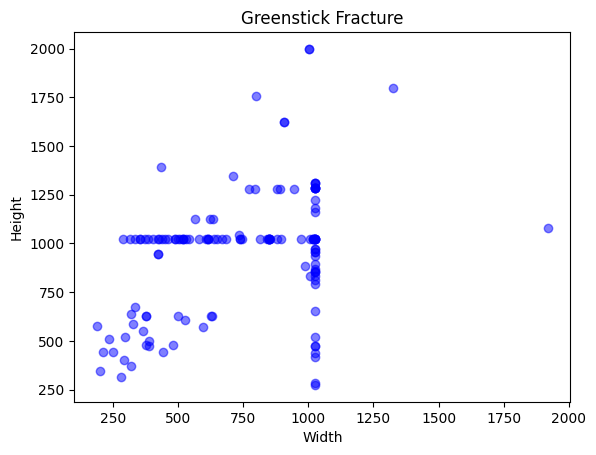

Class Avulsion Fracture has 132 images within 2000x2000 pixels.


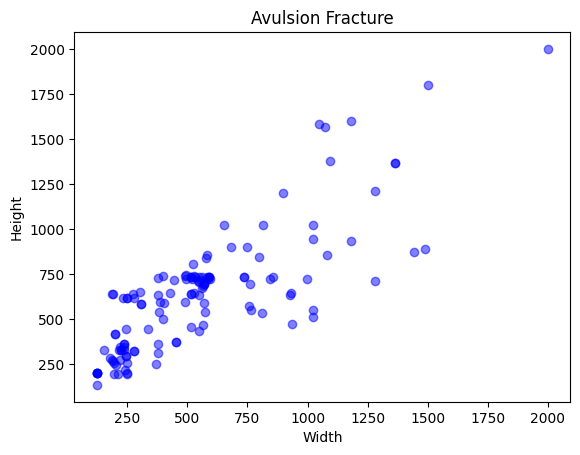

Class Compression fracture has 129 images within 2000x2000 pixels.


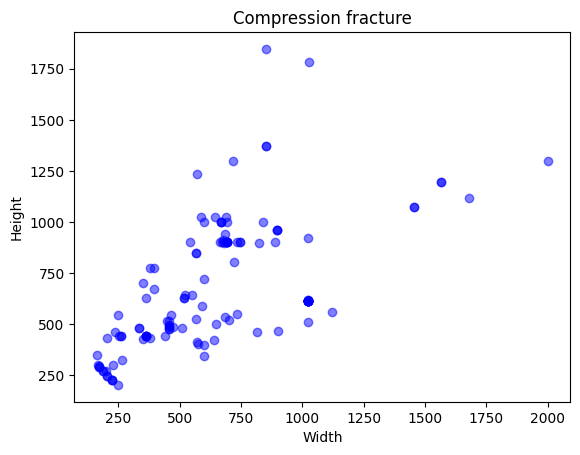

In [ ]:
# Loop through each subdirectory and plot sizes of all images in that directory
for i, subdir_name in enumerate(subdir_names):
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)

    # Initialize empty lists to store sizes of images in this class
    image_sizes = []
    for file_name in file_names:
        image_path = os.path.join(subdir_path, file_name)
        with Image.open(image_path) as img:
            size = img.size
            if size[0] <= 2000 and size[1] <= 2000:
                image_sizes.append(size)

    # Convert image sizes to numpy array
    image_sizes = np.array(image_sizes)

    # Plot scatter plot of image sizes for this class
    fig, ax = plt.subplots()
    ax.scatter(image_sizes[:, 0], image_sizes[:, 1], color='blue', alpha=0.5)
    ax.set_xlabel('Width')
    ax.set_ylabel('Height')
    ax.set_title(subdir_name)

    # Print number of images in this class
    num_images = len(image_sizes)
    print(f"Class {subdir_name} has {num_images} images within 2000x2000 pixels.")

    plt.show()

Check Images of Size lesser than 500x500

Class Longitudinal Fracture has 23 images within 1000 x 1000 pixels.


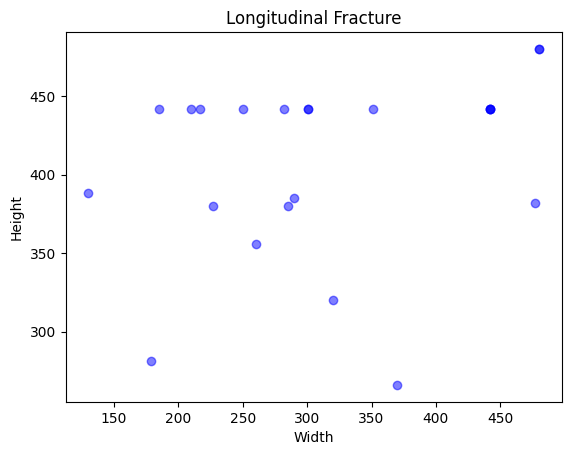

Class Fracture Dislocation has 19 images within 1000 x 1000 pixels.


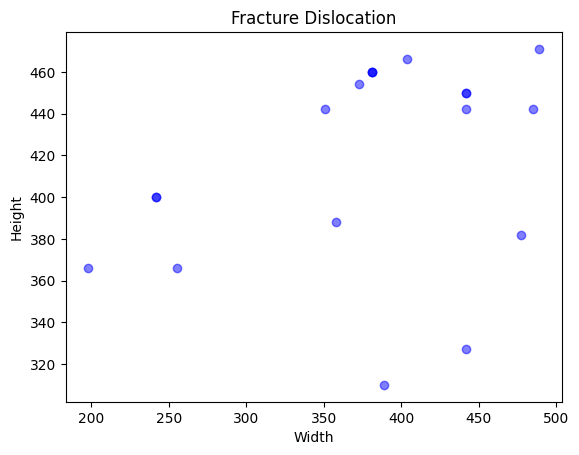

Class Spiral Fracture has 15 images within 1000 x 1000 pixels.


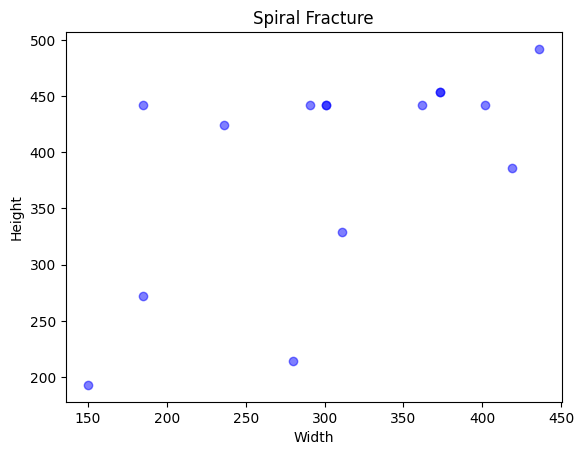

Class Intra-articular Fracture has 34 images within 1000 x 1000 pixels.


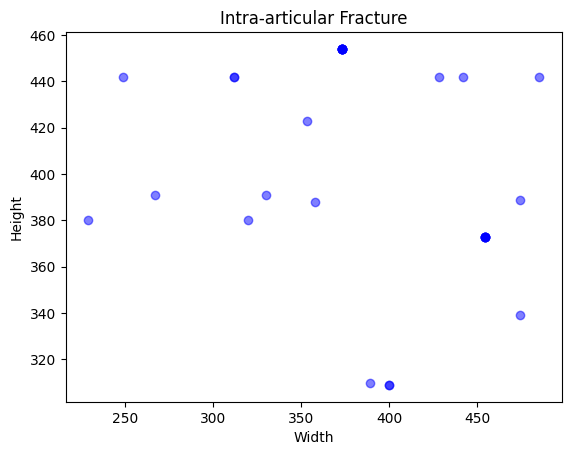

Class Oblique Fracture has 16 images within 1000 x 1000 pixels.


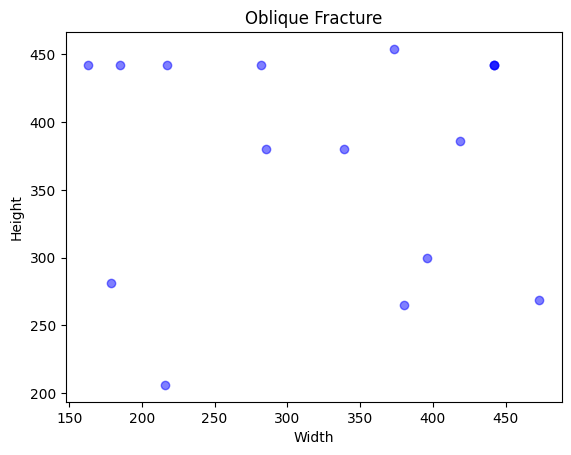

Class Pathological Fracture has 10 images within 1000 x 1000 pixels.


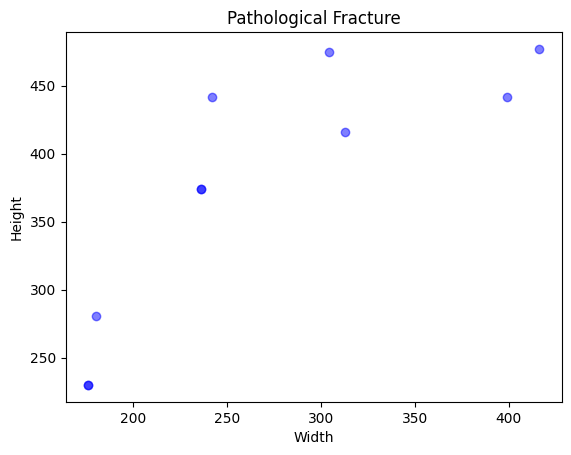

Class Impacted Fracture has 76 images within 1000 x 1000 pixels.


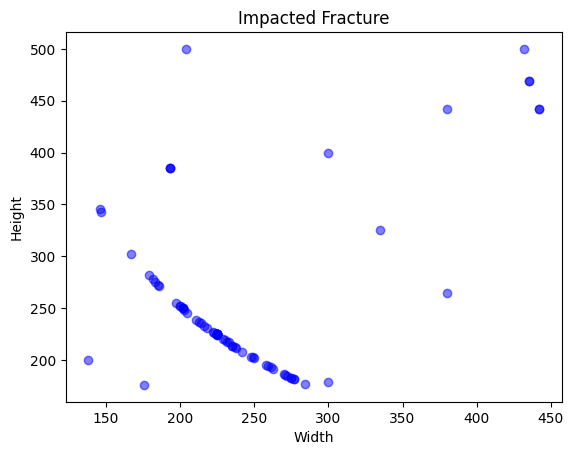

Class Comminuted fracture has 33 images within 1000 x 1000 pixels.


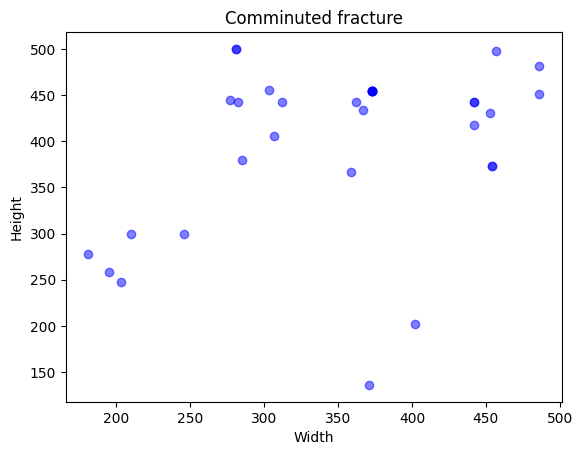

Class Greenstick Fracture has 11 images within 1000 x 1000 pixels.


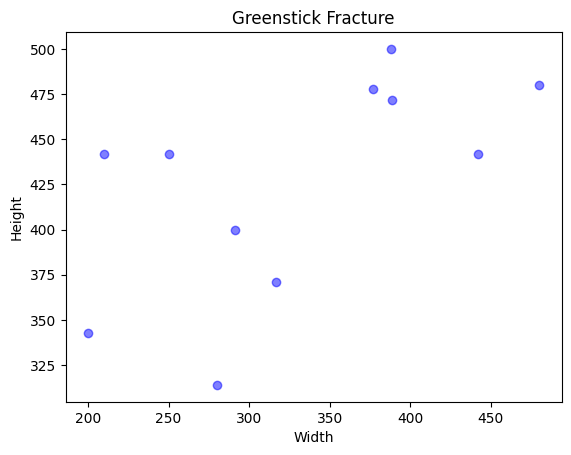

Class Avulsion Fracture has 41 images within 1000 x 1000 pixels.


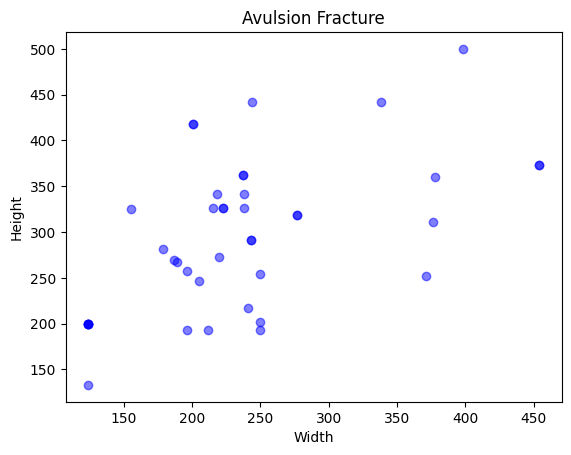

Class Compression fracture has 37 images within 1000 x 1000 pixels.


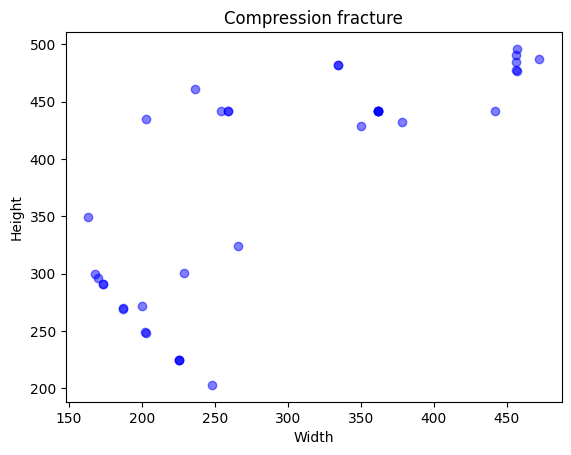

In [ ]:
# Loop through each subdirectory and plot sizes of all images in that directory
for i, subdir_name in enumerate(subdir_names):
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)

    # Initialize empty lists to store sizes of images in this class
    image_sizes = []
    for file_name in file_names:
        image_path = os.path.join(subdir_path, file_name)
        with Image.open(image_path) as img:
            size = img.size
            if size[0] <= 500 and size[1] <= 500:
                image_sizes.append(size)

    # Convert image sizes to numpy array
    image_sizes = np.array(image_sizes)

    # Plot scatter plot of image sizes for this class
    fig, ax = plt.subplots()
    ax.scatter(image_sizes[:, 0], image_sizes[:, 1], color='blue', alpha=0.5)
    ax.set_xlabel('Width')
    ax.set_ylabel('Height')
    ax.set_title(subdir_name)

    # Print number of images in this class
    num_images = len(image_sizes)
    print(f"Class {subdir_name} has {num_images} images within 1000 x 1000 pixels.")

    plt.show()

Creating 2 buckets.

1- All images of size less than 500x500

2- All images of size between 500x500 and 2000x2000

this performs a task of sorting images from a source directory (dir_path)  based on their size into two separate folders (dataset_1 and dataset_2).

why is this done?

- to organize Images by sorting images from a single source directory.
- Creating two new folders (dataset_1 & dataset_2) to separate them by Size
- Size-Based Criteria:
    - dataset_1: Images less than or equal to 500x500 pixels.
    - dataset_2: Images between 500x500 and 2000x2000 pixels.



In [ ]:
dir_path = '/content/drive/MyDrive/Dataset'

# Create directories to store the two datasets
os.makedirs('dataset_1', exist_ok=True)
os.makedirs('dataset_2', exist_ok=True)

# Loop through each subdirectory and copy images within 500 x 500 to dataset 1
for subdir_name in os.listdir(dir_path):
    subdir_path = os.path.join(dir_path, subdir_name)
    for file_name in os.listdir(subdir_path):
        file_path = os.path.join(subdir_path, file_name)
        with Image.open(file_path) as img:
            width, height = img.size
            if width <= 500 and height <= 500:
                dest_path = os.path.join('dataset_1', subdir_name)
                os.makedirs(dest_path, exist_ok=True)
                shutil.copy2(file_path, dest_path)

# Loop through each subdirectory and copy images within 500 x 500 and 2000 x 2000 to dataset 2
for subdir_name in os.listdir(dir_path):
    subdir_path = os.path.join(dir_path, subdir_name)
    for file_name in os.listdir(subdir_path):
        file_path = os.path.join(subdir_path, file_name)
        with Image.open(file_path) as img:
            width, height = img.size
            if 500 <= width <= 2000 and 500 <= height <= 2000:
                dest_path = os.path.join('dataset_2', subdir_name)
                os.makedirs(dest_path, exist_ok=True)
                shutil.copy2(file_path, dest_path)


this helps in counting the number of images within each subdirectory of dataset_1.

why is this done?

- It gives an overview of how many images are stored within each subdirectory category.

- If there are significant imbalances in the number of images across subdirectories, this can help identifing them.

- If the images was stored in dataset_1 based on size, this an help confirm that the sorting process worked as expected and the intended size criteria were met.

In [ ]:
dir_path = 'dataset_1'

# Get list of subdirectory names in the main directory
subdir_names = os.listdir(dir_path)

# Loop through each subdirectory and count the number of files
for subdir_name in subdir_names:
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)
    num_files = len(file_names)
    print(f"{subdir_name}: {num_files} images")

Intra-articular Fracture: 34 images
Fracture Dislocation: 19 images
Oblique Fracture: 16 images
Compression fracture: 37 images
Impacted Fracture: 76 images
Longitudinal Fracture: 23 images
Greenstick Fracture: 11 images
Avulsion Fracture: 41 images
Comminuted fracture: 33 images
Spiral Fracture: 15 images
Pathological Fracture: 10 images


The adds an inner loop to check and print the names of individual image files within each subdirectory.

why is this done?

- This can help confirm that only intended image files (PNG, JPG, JPEG) are present within the subdirectories.

- If there is any suspesion issues with specific images or want to spot-check a few files, this code provides a list of filenames within each subdirectory to review.

In [ ]:
dir_path = 'dataset_1'

# Get list of subdirectory names in the main directory
subdir_names = os.listdir(dir_path)

# Loop through each subdirectory and count the number of files
for subdir_name in subdir_names:
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)
    num_files = len(file_names)
    print(f"{subdir_name}: {num_files} images")
    for file_name in file_names:
        file_path = os.path.join(subdir_path, file_name)
        if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            print(f"\t{file_name}")

Intra-articular Fracture: 34 images
	087.jpeg
	058.jpeg
	117.jpeg
	135.jpg
	108.jpeg
	018.jpg
	120.jpg
	129.jpg
	106.jpeg
	115.jpeg
	130.jpg
	131.jpg
	102.jpg
	119.jpg
	104.jpeg
	097.jpg
	121.jpg
	004.jpg
	103.jpg
	090.jpeg
	059.jpg
	114.jpeg
	122.jpg
	125.jpg
	127.jpg
	128.jpg
	123.jpg
	124.jpg
	086.jpeg
	055.jpeg
	126.jpg
	133.jpg
	132.jpg
	134.jpg
Fracture Dislocation: 19 images
	109.jpeg
	005.jpg
	107.jpeg
	037.jpg
	018.jpg
	121.jpeg
	115.jpeg
	044.jpg
	138.jpg
	116.jpeg
	022.jpg
	016.jpg
	002.jpeg
	019.jpg
	014.jpg
	117.JPG
	038.jpg
	023.jpg
	120.jpeg
Oblique Fracture: 16 images
	104.jpg
	064.jpg
	124.JPG
	137.jpg
	116.JPG
	106.jpeg
	103.jpg
	090.jpeg
	105.jpg
	049.jpg
	114.jpeg
	071.jpg
	110.jpeg
	133.JPG
	117.JPG
	050.jpg
Compression fracture: 37 images
	045.jpg
	046.jpg
	140.jpeg
	088.png
	036.jpg
	033.jpeg
	132.jpeg
	017.jpeg
	093.jpeg
	005.png
	115.jpeg
	008.png
	099.png
	044.jpg
	031.jpg
	041.jpg
	112.jpeg
	053.jpeg
	061.jpg
	081.jpeg
	114.jpeg
	004.png
	080.jpeg
	034.jpeg
	

this helps in counting the number of images within each subdirectory of dataset_2.

why is this done?

- It gives an overview of how many images are stored within each subdirectory category.

- If there are significant imbalances in the number of images across subdirectories, this can help identifing them.

- If the images was stored in dataset_1 based on size, this an help confirm that the sorting process worked as expected and the intended size criteria were met.

In [ ]:
dir_path = 'dataset_2'

# Get list of subdirectory names in the main directory
subdir_names = os.listdir(dir_path)

# Loop through each subdirectory and count the number of files
for subdir_name in subdir_names:
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)
    num_files = len(file_names)
    print(f"{subdir_name}: {num_files} images")

Intra-articular Fracture: 94 images
Fracture Dislocation: 98 images
Oblique Fracture: 93 images
Compression fracture: 75 images
Impacted Fracture: 43 images
Longitudinal Fracture: 81 images
Greenstick Fracture: 92 images
Avulsion Fracture: 65 images
Comminuted fracture: 67 images
Spiral Fracture: 99 images
Pathological Fracture: 102 images


The adds an inner loop to check and print the names of individual image files within each subdirectory.

why is this done?

- This can help confirm that only intended image files (PNG, JPG, JPEG) are present within the subdirectories.

- If there is any suspesion issues with specific images or want to spot-check a few files, this code provides a list of filenames within each subdirectory to review.

In [ ]:
dir_path = 'dataset_2'

# Get list of subdirectory names in the main directory
subdir_names = os.listdir(dir_path)

# Loop through each subdirectory and count the number of files
for subdir_name in subdir_names:
    subdir_path = os.path.join(dir_path, subdir_name)
    file_names = os.listdir(subdir_path)
    num_files = len(file_names)
    print(f"{subdir_name}: {num_files} images")
    for file_name in file_names:
        file_path = os.path.join(subdir_path, file_name)
        if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            print(f"\t{file_name}")

Intra-articular Fracture: 94 images
	045.jpg
	098.jpg
	046.jpg
	140.jpeg
	091.jpeg
	051.jpeg
	035.jpg
	005.jpg
	070.jpeg
	011.jpg
	029.jpg
	036.jpg
	007.jpg
	075.jpeg
	049.jpeg
	077.jpeg
	068.jpeg
	043.jpg
	034.jpg
	002.jpg
	037.jpg
	057.jpeg
	093.jpeg
	060.png
	008.jpg
	067.jpeg
	033.jpg
	113.PNG
	032.jpg
	062.png
	065.jpeg
	100.jpg
	044.jpg
	006.jpg
	031.jpg
	010.jpg
	105.jpeg
	137.png
	096.jpg
	053.jpg
	109.PNG
	072.jpeg
	064.jpeg
	138.jpg
	041.jpg
	139.png
	013.jpg
	073.jpeg
	009.jpg
	001.jpg
	089.jpg
	012.jpg
	081.jpeg
	084.png
	088.jpeg
	047.jpg
	080.jpeg
	015.jpg
	085.png
	039.jpg
	066.jpeg
	061.png
	017.jpg
	050.jpeg
	076.jpeg
	082.jpeg
	003.jpg
	024.jpg
	016.jpg
	026.jpg
	071.jpeg
	099.jpg
	040.jpg
	092.jpeg
	019.jpg
	014.jpg
	021.jpg
	042.jpg
	028.jpg
	054.jpg
	101.png
	074.jpeg
	078.jpeg
	069.jpeg
	038.jpg
	048.jpg
	027.jpg
	023.jpg
	063.jpeg
	020.jpg
	056.jpeg
	052.jpg
	030.jpg
	095.jpg
Fracture Dislocation: 98 images
	045.jpg
	098.jpg
	046.jpg
	111.jpg
	084.jpg
	106.jpg
	0

## Convert Images from RGB to BGR

this helps in preparing the image dataset for use in applications or libraries that require BGR format, while maintaining the original folder structure for organization.

why is this done?

- Some computer vision libraries or frameworks might expect images to be in BGR format by default. Converting beforehand ensures compatibility.

- While RGB represents colors as Red, Green, Blue, BGR represents them as Blue, Green, Red. Standardizing the color channel order can simplify processing pipelines.

In [ ]:
# Path to the original dataset folder
input_folder = 'dataset_1'

# Path to the output folder
output_folder = 'dataset_1_bgr'

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Convert each image file in the current folder to BGR and save to the output folder
    for file in files:
            # Load the image
            img = cv2.imread(os.path.join(root, file))
            # Convert to BGR
            try:
              img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
              # Save to the output folder
              cv2.imwrite(os.path.join(output_folder, root, file), img_bgr)
            except:
              print('Error')

This prepares the image dataset for applications requiring BGR format while maintaining the original folder structure and offering improved error handling for better troubleshooting and debugging capabilities.

why is this done?

- By printing the image path and the specific exception details, it can pinpoint which images failed to process and why. This can help investigate issues like corrupted files or unsupported image formats.

- The more detailed error message can provide clues towards resolving the problem.

- It indicates successful conversions and highlights any errors encountered during processing.

In [ ]:
input_folder = 'dataset_1'
output_folder = 'dataset_1_bgr'

for root, dirs, files in os.walk(input_folder):
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    for file in files:
        img_path = os.path.join(root, file)
        try:
            img = cv2.imread(img_path)
            img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
            cv2.imwrite(os.path.join(output_folder, root, file), img_bgr)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

## Orginal vs BGR Image

This provides a way to inspect the conversion from RGB to BGR format and ensure the images maintain their visual content while using the BGR color order.

why is this done?

- By looking at corresponding pixels in both images, this leads to observing the difference in color channel order (RGB vs. BGR).

- If the images was converted from RGB to BGR, this visualization can help confirm that the conversion process worked as expected and the color information is preserved.

- In some cases, if there was an unexpected color behavior in the application, comparing RGB and BGR versions can help identify potential issues related to color format assumptions.

In [ ]:
dir_path1 = 'dataset_1/'
dir_path2 = 'dataset_1_bgr/dataset_1/'

# Avulsion Fracture
fileName = "/Avulsion Fracture/090.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Avulsion Fracture')
plt.show()

# Comminuted Fracture
fileName = "/Comminuted fracture/084.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Comminuted Fracture')
plt.show()

# Compression Fracture
fileName = "/Compression fracture/045.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Compression Fracture')
plt.show()

# Fracture Dislocation
fileName = "/Fracture Dislocation/109.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Fracture Dislocation')
plt.show()

# GreenStick Fracture
fileName = "/Greenstick Fracture/111.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('GreenStick Fracture')
plt.show()

# Impacted Fracture
fileName = "/Impacted Fracture/096.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Impacted Fracture')
plt.show()

# Intra-articular Fracture
fileName = "/Intra-articular Fracture/087.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Intra-articular Fracture')
plt.show()

# Longitudinal Fracture
fileName = "/Longitudinal Fracture/111.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Longitudinal Fracture')
plt.show()

# Oblique Fracture
fileName = "/Oblique Fracture/104.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Oblique Fracture')
plt.show()

# Pathological Fracture
fileName = "/Pathological Fracture/112.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Pathological Fracture')
plt.show()

# Spiral Fracture
fileName = "/Spiral Fracture/046.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Spiral Fracture')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'dataset_1//Avulsion Fracture/090.png'

## Resizing the Images

This helps preparing the BGR image dataset for tasks that require a specific image size while maintaining the original folder structure for organization.

why is this done?

- Many deep learning models for image processing or computer vision tasks expect images to have a specific input size. Resizing ensures all images conform to the expected format for the model.
- Resizing images to a uniform size can simplify processing and potentially improve model performance by reducing the impact of image size variations.
- Larger images require more computational resources to process. Resizing to a smaller size can improve processing speed, especially when dealing with large datasets.

In [ ]:
# Path to the original dataset folder
input_folder = './dataset_1_bgr/dataset_1'

# Path to the output folder
output_folder = 'dataset_1_resized'

# Target size of the images
target_size = (224, 224)

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Resize each image file in the current folder and save to the output folder
    for file in files:
        # Load the image
        img = cv2.imread(os.path.join(root, file))
        # Resize the image to the target size
        img_resized = cv2.resize(img, target_size)
        # Save to the output folder
        cv2.imwrite(os.path.join(output_folder, root, file), img_resized)


Orginal vs Resized Image

This iterates through all files within the specified directory and its subdirectories, printing the complete paths to each file.

- It can help you confirm that the directory structure and files within the specified path exist as expected.
- If there is a particular file within the directory hierarchy, it can be used to list all files.
- For understanding the contents of a dataset, this code can provide a list of all the files present within the directory structure.


In [ ]:
import os

dir_path = 'dataset_1_bgr/dataset_1/'

for root, dirs, files in os.walk(dir_path):
    for file in files:
        print(os.path.join(root, file))

dataset_1_bgr/dataset_1/Intra-articular Fracture/087.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/058.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/117.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/135.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/108.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/018.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/120.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/129.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/106.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/115.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/130.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/131.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/102.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/119.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/104.jpeg
dataset_1_bgr/dataset_1/Intra-articular Fracture/097.jpg
dataset_1_bgr/dataset_1/Intra-articular Fracture/121.jpg
dataset_1_bgr/dataset_1/

In [ ]:
import os

dir_path = 'dataset_1_resized/dataset_1_bgr/dataset_1/'

for root, dirs, files in os.walk(dir_path):
    for file in files:
        print(os.path.join(root, file))

dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/087.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/058.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/117.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/135.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/108.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/018.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/120.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/129.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/106.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/115.jpeg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/130.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/131.jpg
dataset_1_resized/dataset_1_bgr/dataset_1/Intra-articular Fracture/102.jpg
dataset_1_resized/d

This checks whether a specific directory path exists and prints a message accordingly.

why is this done?

- In larger programs, it is used to check if a directory exists before attempting to access files within it. This can prevent errors if the directory is missing.
- Based on the existence of a directory, yit might be used to perform different actions in the code. For example, if the directory doesn't exist, it might be created before proceeding.
- When working with file paths or user input, verifying the existence of directories can help ensure data integrity and prevent unexpected behavior.

In [ ]:
dir_path2 = 'dataset_1_resized/dataset_1_bgr/dataset_1/'
if os.path.exists(dir_path2):
    print(f"{dir_path2} exists.")
else:
    print(f"{dir_path2} does not exist.")

dataset_1_resized/dataset_1_bgr/dataset_1/ exists.


This effectively reads and compares RGB and BGR images while incorporating error handling for missing files, making it more robust and informative.

why is this done?

- It gracefully handles cases where images might be missing in either the original or resized folder. This prevents errors during processing and allow to continue with other images if some are missing.
- It prints messages indicating which specific file was not found, providing better debugging information.
- The function returns image1 and image2 allowing the caller to decide how to handle missing images.

In [ ]:
dir_path1 = 'dataset_1_bgr/dataset_1/'
dir_path2 = 'dataset_1_resized/dataset_1_bgr/dataset_1/'

# Print the directory paths for verification
print(f"dir_path1: {dir_path1}")
print(f"dir_path2: {dir_path2}")

# Function to check if image file exists and read it
def read_image(file_name):
  path1 = dir_path1 + file_name
  path2 = dir_path2 + file_name

  # Check if file exists in both paths before reading
  if os.path.exists(path1):
    image1 = mpimg.imread(path1)
  else:
    print(f"File not found: {path1}")
    image1 = None  # Or handle missing image case differently

  if os.path.exists(path2):
    image2 = mpimg.imread(path2)
  else:
    print(f"File not found: {path2}")
    image2 = None  # Or handle missing image case differently

  return image1, image2

# Example usage for Avulsion fracture
fileName = "Avulsion fracture/088.png"
image1, image2 = read_image(fileName)

if image1 is not None and image2 is not None:
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))
  axs[0].imshow(image1)
  axs[0].set_title('RGB Image')
  axs[1].imshow(image2)
  axs[1].set_title('BGR Image')
  fig.suptitle('Avulsion Fracture')
  plt.show()
else:
  print("One or both images not found. Skipping Avulsion fracture.")

dir_path1: dataset_1_bgr/dataset_1/
dir_path2: dataset_1_resized/dataset_1_bgr/dataset_1/
File not found: dataset_1_bgr/dataset_1/Avulsion fracture/088.png
File not found: dataset_1_resized/dataset_1_bgr/dataset_1/Avulsion fracture/088.png
One or both images not found. Skipping Avulsion fracture.


This effectively visualizes RGB and BGR versions of fracture images from the dataset, potentially helping in understanding the difference in color channel order.

why is this done?

- While a loop could be used to automate iterating through fracture types, separating them provides clarity and makes it easier to modify or remove comparisons for specific fractures.

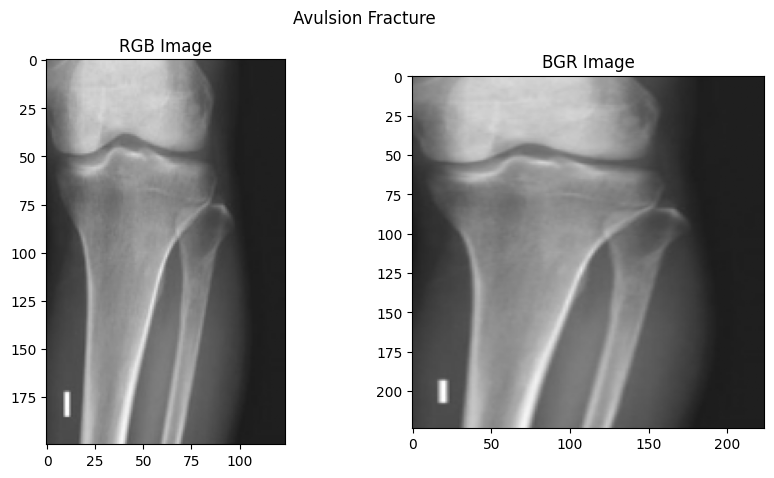

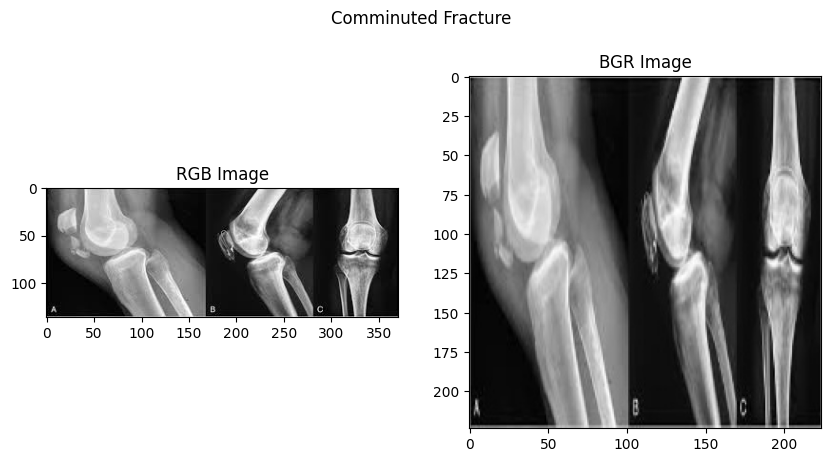

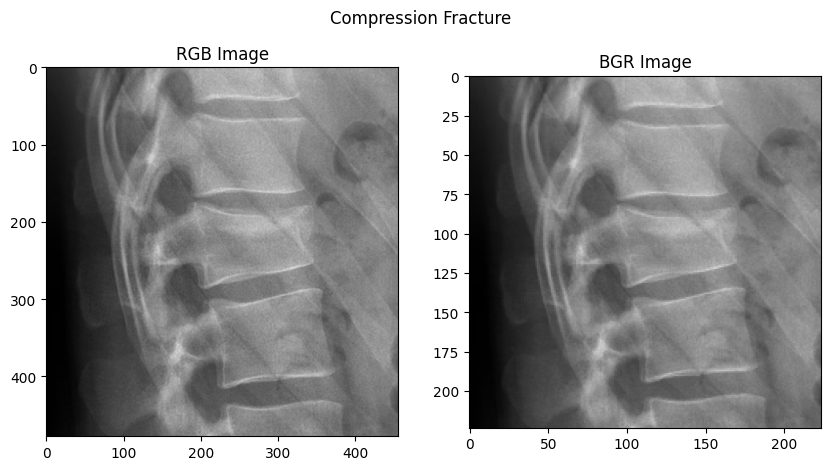

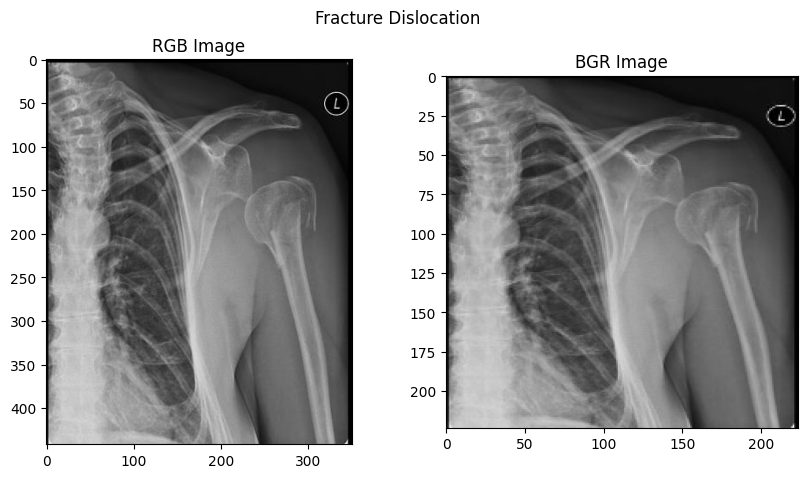

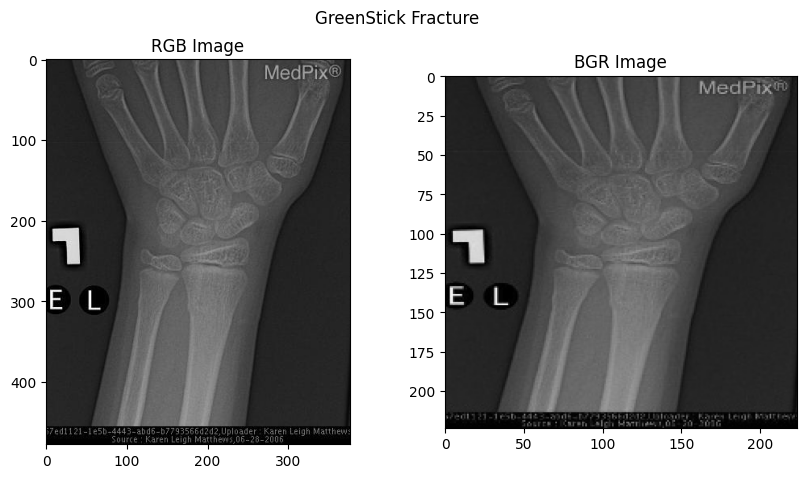

...

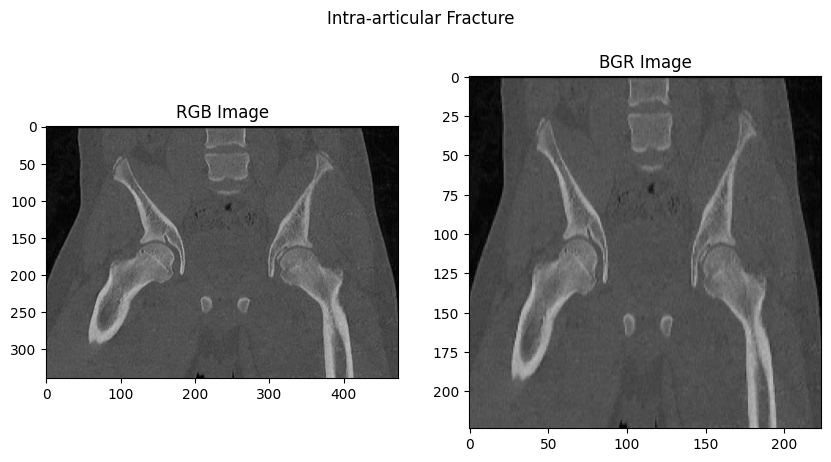

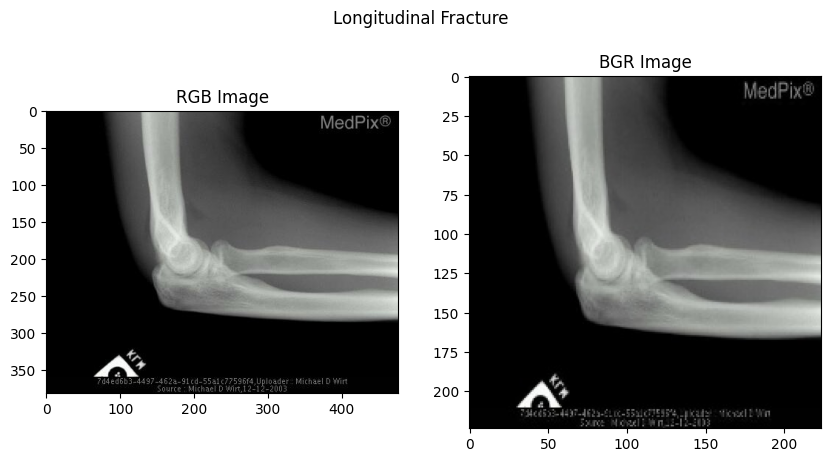

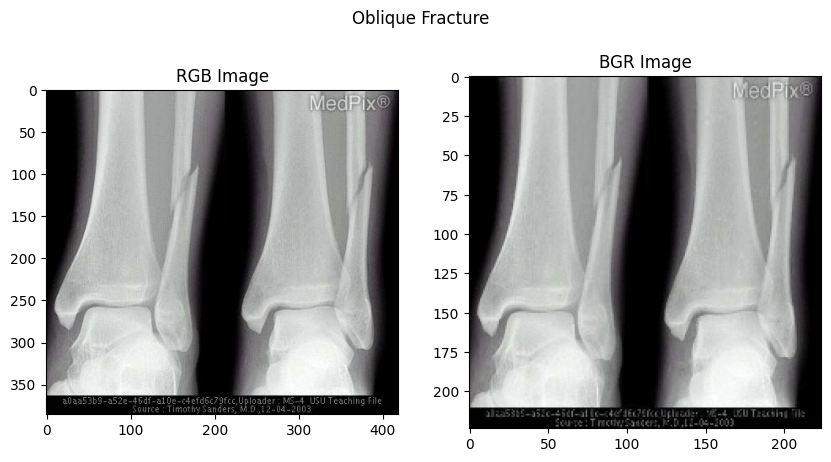

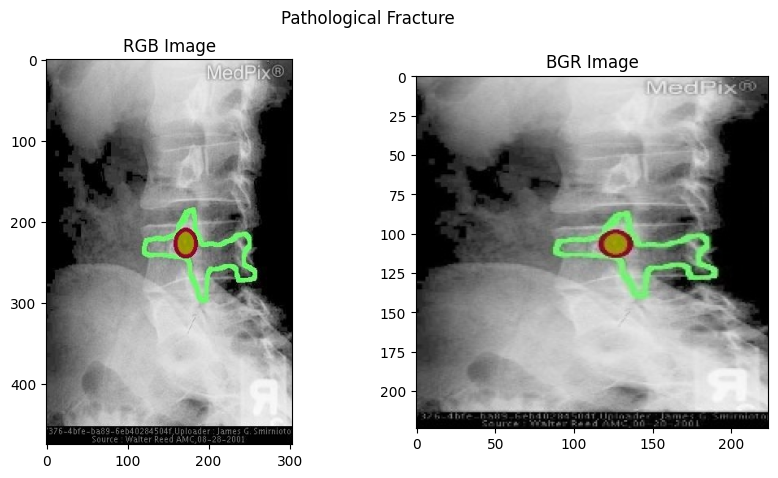

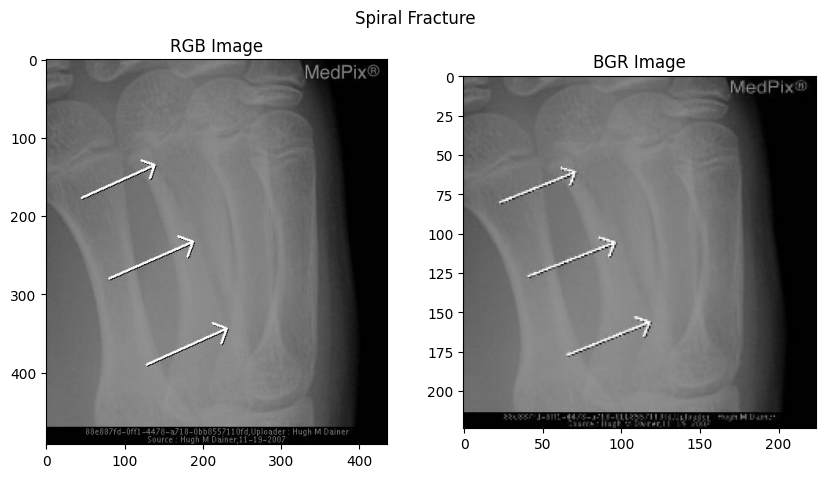

In [ ]:
dir_path1 = 'dataset_1_bgr/dataset_1/'
dir_path2 = 'dataset_1_resized/dataset_1_bgr/dataset_1/'

# Avulsion Fracture
fileName = "Avulsion Fracture/001.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Avulsion Fracture')
plt.show()

# Comminuted Frature
fileName = "Comminuted fracture/084.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Comminuted Fracture')
plt.show()

# Compression Fracture
fileName = "Compression fracture/004.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Compression Fracture')
plt.show()

# Fracture Dislocation
fileName = "Fracture Dislocation/109.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Fracture Dislocation')
plt.show()

# GreenStick Fracture
fileName = "Greenstick Fracture/012.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('GreenStick Fracture')
plt.show()

# Impacted Fracture
fileName = "Impacted Fracture/025.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Impacted Fracture')
plt.show()


# Intra-articular Fracture
fileName = "Intra-articular Fracture/055.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Intra-articular Fracture')
plt.show()

# Longitudinal Fracture
fileName = "Longitudinal Fracture/025.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Longitudinal Fracture')
plt.show()

# Oblique Fracture
fileName = "Oblique Fracture/049.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Oblique Fracture')
plt.show()

# Pathological Fracture
fileName = "Pathological Fracture/031.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Pathological Fracture')
plt.show()

# Spiral Fracture
fileName = "Spiral Fracture/037.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image1)
axs[0].set_title('RGB Image')
axs[1].imshow(image2)
axs[1].set_title('BGR Image')
fig.suptitle('Spiral Fracture')
plt.show()

This imports several image augmentation techniques from the 'torchvision.transforms' module and creates a list containing those transformations.

why is this done?

- By artificially creating variations of existing images, it can effectively enlarge the training dataset without needing to collect more data.
- By training the model on a wider variety of transformed images, it can potentially improve its ability to perform well on unseen data that might have slight variations in orientation, color, or other aspects.
- Augmentation helps prevent the model from overfitting to the specific characteristics of the training data, leading to better performance on unseen data.

In [ ]:
from torchvision.transforms import RandomRotation, RandomHorizontalFlip, RandomVerticalFlip, RandomResizedCrop, RandomCrop, ColorJitter
augmentation_transforms = [RandomRotation(degrees=15), RandomHorizontalFlip(), RandomVerticalFlip(),ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2)]

## Applying Data Augmentation.
1- Rotation

2- Horizontal Flip

3- Vertical Flip

4-Color J

In [ ]:
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

This applies a random rotation augmentation (15 degrees) to the first 5 images in each subfolder of the input folder and saves the augmented versions in a separate output folder.

why is this done?

- It demonstrates a basic example of image augmentation using random rotation. By creating slightly rotated versions of the first 5 images in each subfolder, it's artificially increasing the size and diversity of the dataset. This can potentially improve the generalizability of the deep learning model, especially if the task involves recognizing objects from different orientations.

In [ ]:
output_folder = 'rotated_dataset'

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply one data augmentation to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply a random data augmentation transform
        img = Image.open(os.path.join(root, file))
        transform = RandomRotation(degrees=15)
        augmented_img = transform(img)
        # Save the augmented image to the output folder with the augmentation name appended to the original image name
        augmentation_name = transform.__class__.__name__
        output_file = file
        augmented_img.save(os.path.join(output_folder, root, output_file))

This it apply a random horizontal flip to the images.

why is this done?

- horizontal flipping as a form of image augmentation. By creating flipped versions of the first 5 images in each subfolder, it's increasing the diversity of the dataset. This can be beneficial for tasks where objects can appear in either orientation (left or right facing).

In [ ]:
# Define the input and output directories
output_folder = 'rotatedH_dataset'

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply one data augmentation to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply a random data augmentation transform
        img = Image.open(os.path.join(root, file))
        transform = RandomHorizontalFlip()
        augmented_img = transform(img)
        # Save the augmented image to the output folder with the augmentation name appended to the original image name
        augmentation_name = transform.__class__.__name__
        output_file = file
        augmented_img.save(os.path.join(output_folder, root, output_file))

This applies a random vertical flip augmentation to the images.

why is this used?

- Applying random vertical flips to the first 5 images in each subfolder. This increases the diversity of the dataset and can be beneficial for tasks where objects can appear in either vertical orientation (upside down or normal).


In [ ]:
# Define the input and output directories
output_folder = 'rotatedV_dataset'

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply one data augmentation to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply a random data augmentation transform
        img = Image.open(os.path.join(root, file))
        transform = RandomVerticalFlip()
        augmented_img = transform(img)
        # Save the augmented image to the output folder with the augmentation name appended to the original image name
        augmentation_name = transform.__class__.__name__
        output_file = file
        augmented_img.save(os.path.join(output_folder, root, output_file))

This apply a random color jitter augmentation to the first 5 images in each subfolder of the input folder and saves the augmented versions in a separate output folder.

why is this done?

- Color jitter is another image augmentation technique. Here, it randomly adjusts the brightness, contrast, saturation, and hue of the first 5 images in each subfolder. This helps simulate variations in lighting conditions and color properties that might occur in real-world scenarios. By introducing these variations, it can improve the robustness of the deep learning model to such changes, potentially leading to better performance on unseen data.

In [ ]:
# Define the input and output directories
output_folder = 'colorJ_dataset'

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply one data augmentation to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply a random data augmentation transform
        img = Image.open(os.path.join(root, file))
        transform = ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2)
        augmented_img = transform(img)
        # Save the augmented image to the output folder with the augmentation name appended to the original image name
        augmentation_name = transform.__class__.__name__
        output_file = file
        augmented_img.save(os.path.join(output_folder, root, output_file))

This defines five directory paths (dir_path1 to dir_path5), each likely pointing to a subfolder within a larger dataset structure.

why is this done?

- It can visually inspect or train models on different augmented versions to see how they affect performance.
- Having separate folders allow to easily add or remove specific augmentation types for further experimentation.
- Clear folder structures improve code readability and make it easier to reuse specific datasets or augmented versions for future tasks.


In [ ]:
dir_path1 = 'dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path2 = 'rotatedH_dataset/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path3 = 'rotatedV_dataset/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path4 = 'rotated_dataset/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path5 = 'colorJ_dataset/dataset_1_resized/dataset_1_bgr/dataset_1/'

## Normal vs Rotated vs Flipped vs Color Jitter

This demonstrates how data augmentation can be applied to fracture image datasets and how the resulting variations can be visualized for better understanding and potentially improved deep learning applications.

why is this done?

- By seeing how the images are flipped, rotated, and color-adjusted, it can get a better grasp of the data augmentation techniques used.
- Visualizing the images can help identify any issues with the dataset, such as blurry images or inconsistencies.
- Augmented datasets can improve the performance of deep learning models by increasing the variety of data they are trained on.

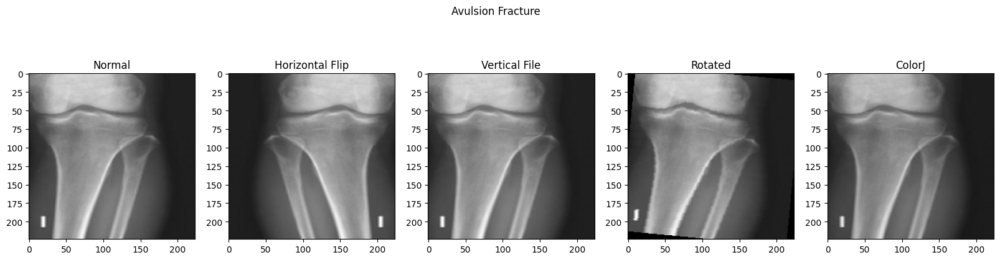

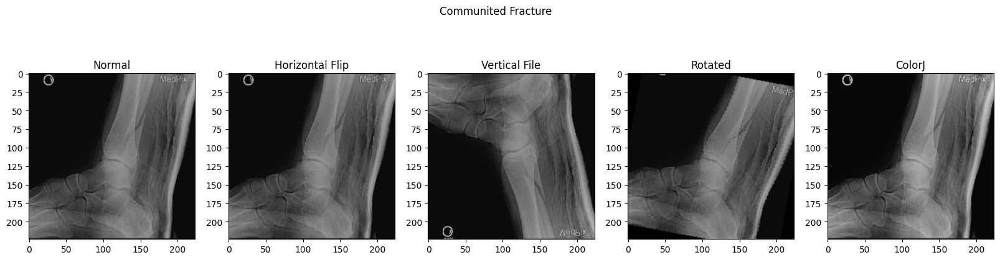

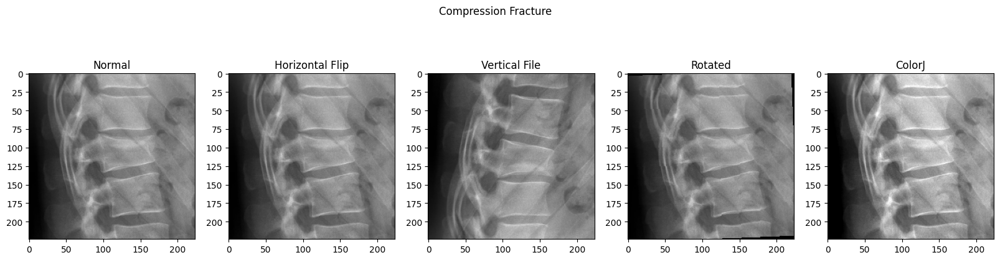

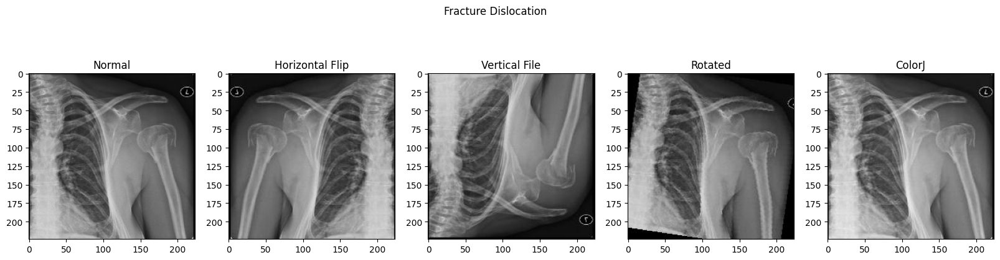

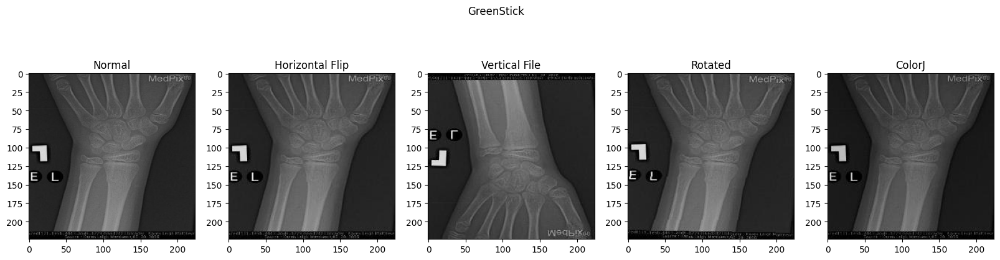

...

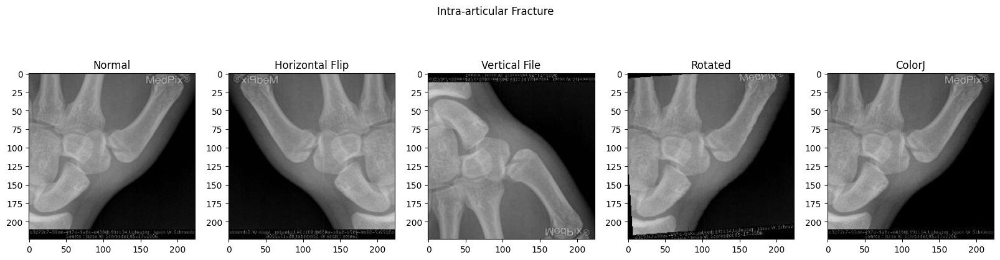

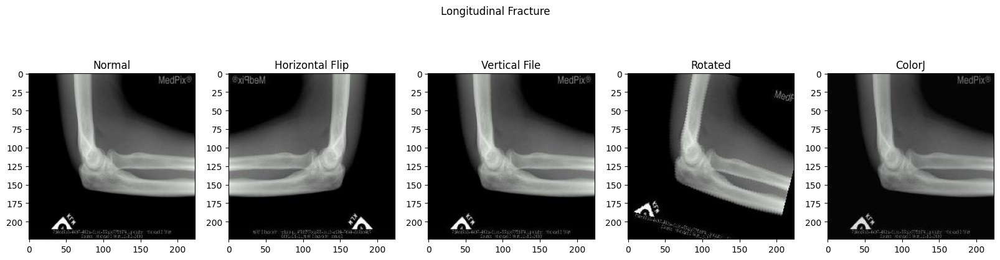

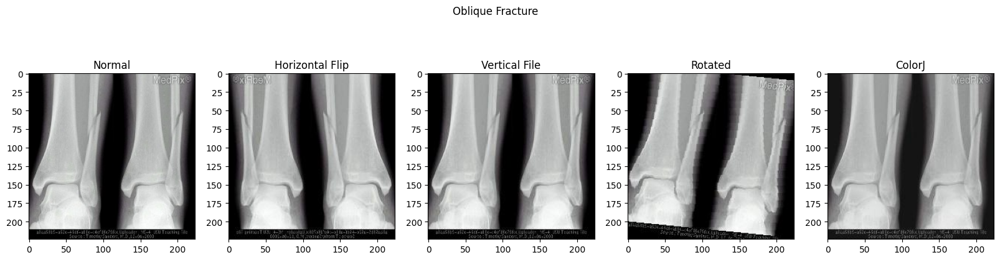

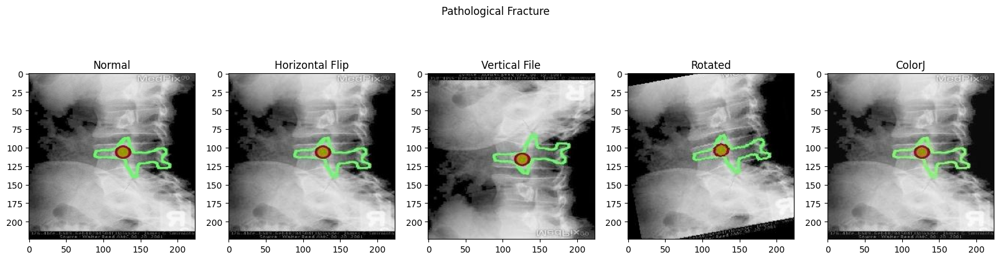

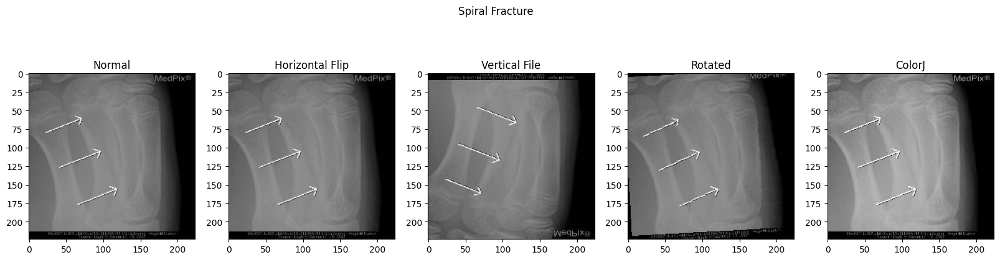

In [ ]:
# Avulsion Fracture
fileName = "Avulsion Fracture/001.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Avulsion Fracture')
plt.show()

# Comminuted Fracture
fileName = "Comminuted fracture/001.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Communited Fracture')
plt.show()

# Compression Fracture
fileName = "Compression fracture/004.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Compression Fracture')
plt.show()

# Fracture Dislocation
fileName = "Fracture Dislocation/109.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Fracture Dislocation')
plt.show()

# GreenStick Fracture
fileName = "Greenstick Fracture/012.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('GreenStick')
plt.show()

# Impacted Fracture
fileName = "Impacted Fracture/025.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Impacted')
plt.show()


# Intra-articular Fracture
fileName = "Intra-articular Fracture/004.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Intra-articular Fracture')
plt.show()

# Longitudinal Fracture
fileName = "Longitudinal Fracture/025.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Longitudinal Fracture')
plt.show()

# Oblique Fracture
fileName = "Oblique Fracture/049.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Oblique Fracture')
plt.show()

# Pathological Fracture
fileName = "Pathological Fracture/031.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Pathological Fracture')
plt.show()

# Spiral Fracture
fileName = "Spiral Fracture/037.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('Horizontal Flip')
axs[2].imshow(image3)
axs[2].set_title('Vertical File')
axs[3].imshow(image4)
axs[3].set_title('Rotated')
axs[4].imshow(image5)
axs[4].set_title('ColorJ')

fig.suptitle('Spiral Fracture')
plt.show()

This applies a Gaussian blur augmentation to the first 5 images in each subfolder of the original dataset.

why is this done?

- Blur can occur in real-world images due to camera movement, out-of-focus effects, or low quality. Introducing blur variations through augmentation helps the model become more robust to such variations in real-world data.
- By training a model on blurred images alongside the originals, it can learn features that are less sensitive to blur and might generalize better to unseen blurred images.

In [ ]:
# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the blurred images will be saved
output_folder = "gaussian_blur"

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply Gaussian blur to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply Gaussian blur with a randomly selected radius
        img = Image.open(os.path.join(root, file))
        radius = 3  # Select a random radius between 1 and 5
        blur_img = img.filter(ImageFilter.GaussianBlur(radius=radius))
        # Save the blurred image to the output folder with the blur radius appended to the original image name
        output_file = file
        blur_img.save(os.path.join(output_folder, root, output_file))

This apply thresholding to the first 5 images in each subfolder of the original dataset.

why is this done?

- Thresholding can be a simple yet effective way to segment objects from the background in an image. By converting the image to binary (foreground and background), it can isolate the object of interest for further analysis.
- Thresholding can be used to extract specific features from an image based on their intensity levels. For example, in a medical image, it might threshold to isolate high-intensity bone regions from lower-intensity tissue.

In [ ]:

# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the thresholded images will be saved
output_folder = "thresholded"

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply thresholding to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply thresholding to create a binary image
        img = cv2.imread(os.path.join(root, file), cv2.IMREAD_GRAYSCALE)
        threshold = 127  # Set the threshold value
        _, threshold_img = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)
        # Save the thresholded image to the output folder
        output_file = file
        cv2.imwrite(os.path.join(output_folder, root, output_file), threshold_img)

This apply sharpening to the first 5 images in each subfolder of the original dataset.

why is this done?

- Sharpening can improve the perception of details and edges in an image, especially when dealing with images that might be slightly blurry due to camera focus or compression.
- For tasks like object detection or image segmentation, sharpening can make it easier to identify and extract specific features from the image.
- In some cases, sharpening can enhance the visual appeal of an image by making it appear more crisp and clear.

In [ ]:
# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the sharpened images will be saved
output_folder = "sharpened"

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply sharpening to each image
    selected_files = files
    for file in selected_files:
        # Load the image and apply sharpening using a 3x3 kernel
        img = cv2.imread(os.path.join(root, file))
        kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]], dtype=np.float32)  # Define the kernel for sharpening
        sharpened_img = cv2.filter2D(img, -1, kernel)
        # Save the sharpened image to the output folder
        output_file = file
        cv2.imwrite(os.path.join(output_folder, root, output_file), sharpened_img)

 Thid extracts and visualizes contours in the first 5 images from each subfolder of the original dataset.

why is this done?

- By analyzing the shape and properties of contours, it can identify and potentially recognize objects in an image. This is a crucial step in many computer vision applications.
- Contours can be used to segment objects from the background in an image. This is useful for isolating specific regions of interest for further analysis.
- Analysing the contour properties (e.g., area, perimeter) can be used to measure the size and shape of objects in the image.


In [ ]:
# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the contour images will be saved
output_folder = "contour"

# Set the threshold value for contour detection
threshold_value = 127

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply contour detection to each image
    selected_files = files
    for file in selected_files:
        # Load the image and convert it to grayscale
        img = cv2.imread(os.path.join(root, file))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Apply binary thresholding to create a binary image
        _, binary_img = cv2.threshold(gray_img, threshold_value, 255, cv2.THRESH_BINARY)
        # Find contours in the binary image
        contours, _ = cv2.findContours(binary_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        # Draw the contours on the original image and save it to the output folder
        contour_img = cv2.drawContours(img, contours, -1, (0, 0, 255), 2)
        output_file = file
        cv2.imwrite(os.path.join(output_folder, root, output_file), contour_img)

This apply adaptive thresholding to the first 5 images in each subfolder of the original dataset.

why is this done?

- By calculating a threshold value for small image neighborhoods, adaptive thresholding can adapt to local variations in lighting. This can lead to better segmentation of objects in images with non-uniform backgrounds.
- Especially in images with varying brightness or shadows, adaptive thresholding can potentially provide more accurate segmentation of objects compared to using a single global threshold.

In [ ]:
# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the adaptive threshold images will be saved
output_folder = "adaptive_threshold"

# Set the block size and constant value for adaptive thresholding
block_size = 15
constant_value = 2

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply adaptive thresholding to each image
    selected_files = files
    for file in selected_files:
        # Load the image and convert it to grayscale
        img = cv2.imread(os.path.join(root, file))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Apply adaptive thresholding to create a binary image
        binary_img = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, constant_value)
        # Save the binary image to the output folder
        output_file = file
        cv2.imwrite(os.path.join(output_folder, root, output_file), binary_img)

This defines six directory paths (dir_path1 to dir_path6).

why is this done?

- This represent the results of applying different image processing techniques to the original dataset. This organized structure allows you to easily access and compare the original images alongside their processed versions.

In [ ]:
dir_path1 = 'dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path2 = 'gaussian_blur/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path3 = 'contour/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path4 = 'sharpened/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path5 = 'thresholded/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path6 = 'adaptive_threshold/dataset_1_resized/dataset_1_bgr/dataset_1/'

This creates a visual comparison of different image processing techniques applied to various fracture types.

why is this done?

- Allows to visually compare how different image processing techniques affect the visualization of various fracture types. By looking at the side-by-side comparisons, it can see how techniques like Gaussian blur, sharpening, thresholding, and adaptive thresholding might highlight or obscure certain features in the fracture images. This can be helpful for tasks like fracture detection or classification.


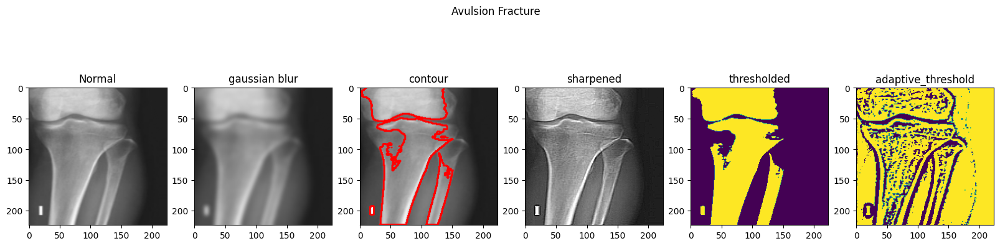

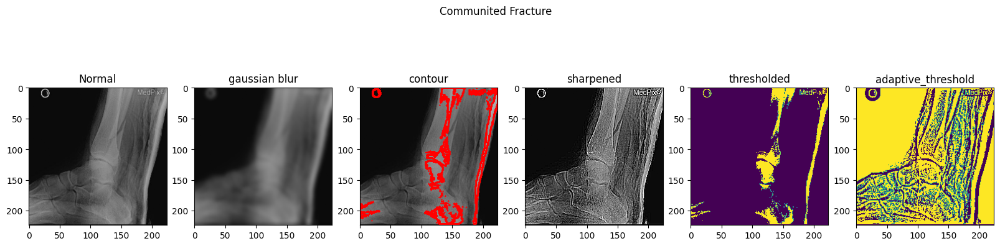

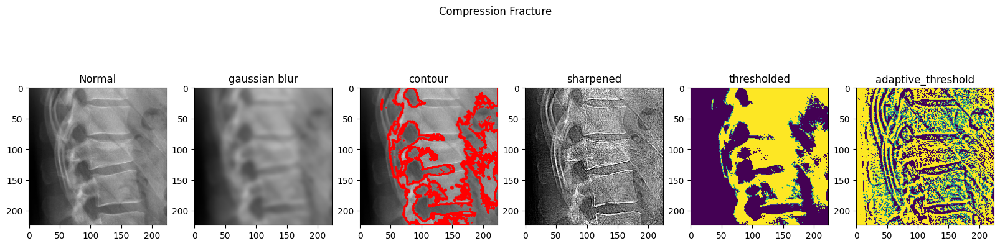

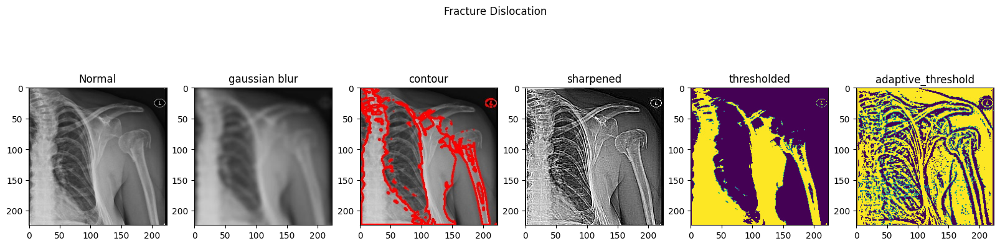

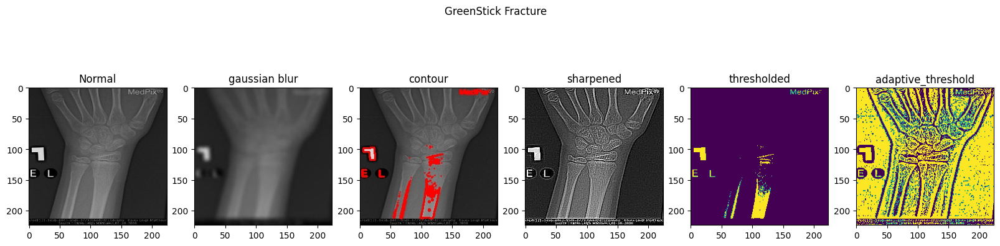

...

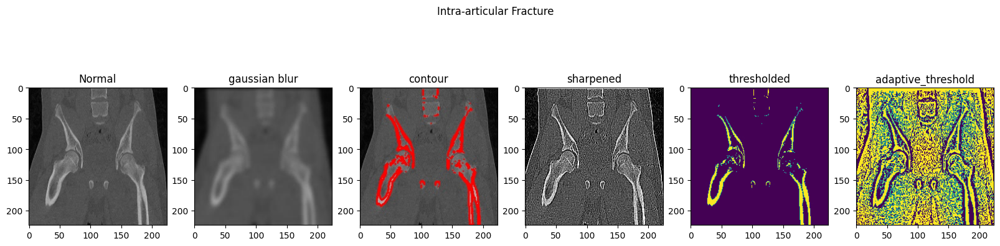

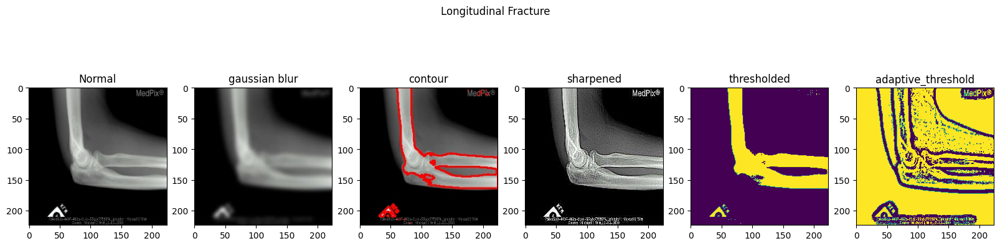

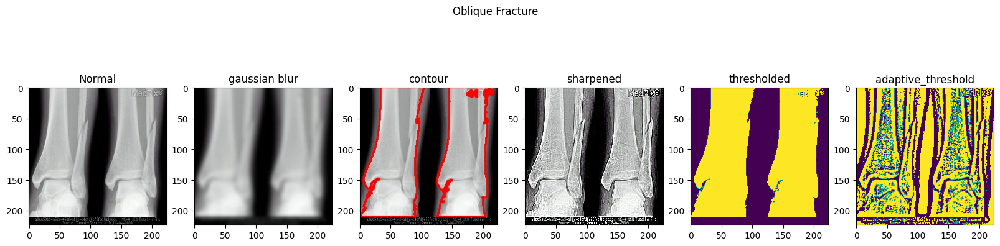

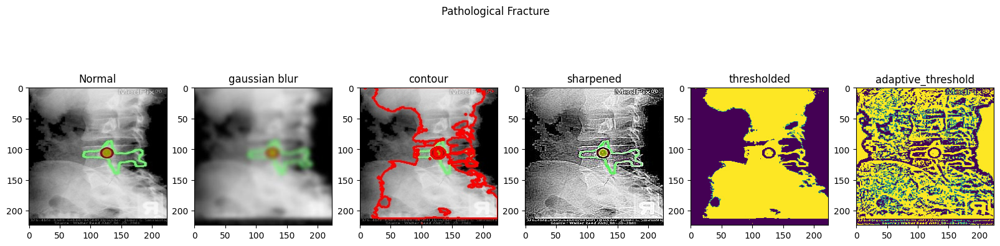

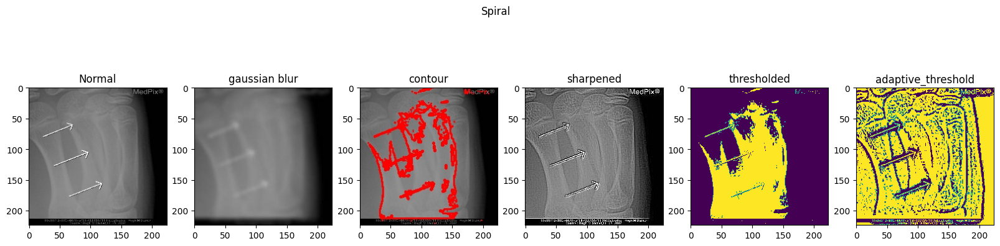

In [ ]:
# Avulsion Fracture

x = 20
y = 5

fileName = "Avulsion Fracture/001.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Avulsion Fracture')
plt.show()

# Comminuted Fracture
fileName = "Comminuted fracture/001.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')
fig.suptitle('Communited Fracture')
plt.show()

# Compression Fracture
fileName = "Compression fracture/004.png"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')
fig.suptitle('Compression Fracture')
plt.show()

# Fracture Dislocation
fileName = "Fracture Dislocation/109.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Fracture Dislocation')
plt.show()

# GreenStick Fracture
fileName = "Greenstick Fracture/012.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')
fig.suptitle('GreenStick Fracture')
plt.show()

# Impacted Fracture
fileName = "Impacted Fracture/025.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Impacted Fracture')
plt.show()


# Intra-articular Fracture
fileName = "Intra-articular Fracture/055.jpeg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Intra-articular Fracture')
plt.show()

# Longitudinal Fracture
fileName = "Longitudinal Fracture/025.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Longitudinal Fracture')
plt.show()

# Oblique Fracture
fileName = "Oblique Fracture/049.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Oblique Fracture')
plt.show()

# Pathological Fracture
fileName = "Pathological Fracture/031.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')
fig.suptitle('Pathological Fracture')
plt.show()

# Spiral Fracture
fileName = "Spiral Fracture/037.jpg"
path1 = dir_path1 + fileName
path2 = dir_path2 + fileName
path3 = dir_path3 + fileName
path4 = dir_path4 + fileName
path5 = dir_path5 + fileName
path6 = dir_path6 + fileName

image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
image3 = mpimg.imread(path3)
image4 = mpimg.imread(path4)
image5 = mpimg.imread(path5)
image6 = mpimg.imread(path6)

fig, axs = plt.subplots(1, 6, figsize=(x, y))

axs[0].imshow(image1)
axs[0].set_title('Normal')
axs[1].imshow(image2)
axs[1].set_title('gaussian blur')
axs[2].imshow(image3)
axs[2].set_title('contour')
axs[3].imshow(image4)
axs[3].set_title('sharpened')
axs[4].imshow(image5)
axs[4].set_title('thresholded')
axs[5].imshow(image6)
axs[5].set_title('adaptive_threshold')

fig.suptitle('Spiral')
plt.show()

In [ ]:
dir_path = '/content/drive/MyDrive/Dataset'
classNames = os.listdir(dir_path)

This perform label encoding on a set of class names.

why is this done?

- Many machine learning algorithms require numerical features as input. When dealing with categorical data represented by text labels (e.g., "cat", "dog"), label encoding converts these labels into numerical values that machine learning models can understand and process more easily.

In [ ]:
# Create a LabelEncoder object
le = LabelEncoder()

# Fit the label encoder on the class names and transform them to numerical labels
class_labels = le.fit_transform(classNames)

This iterates through the class names and their corresponding numerical labels.

why is this done?

This is likely used for debugging or verification purposes. After performing label encoding (where class names are converted to numerical labels), it can be helpful to see the mapping between the original class names and their assigned numerical values. This can help ensure the label encoding process worked as expected and that each class name has a unique numerical representation.

In [ ]:
for i in range(len(classNames)):
  print(classNames[i],':',class_labels[i])

Longitudinal Fracture : 7
Fracture Dislocation : 3
Spiral Fracture : 10
Intra-articular Fracture : 6
Oblique Fracture : 8
Pathological Fracture : 9
Impacted Fracture : 5
Comminuted fracture : 1
Greenstick Fracture : 4
Avulsion Fracture : 0
Compression fracture : 2


This performs contour detection and visualization on a set of images and saves the resulting images with contours overlaid.

why is this done?

- This automates the process of detecting contours in a set of images, potentially highlighting edges or object boundaries. By saving the resulting images with contours, it can visually inspect the effectiveness of the contour detection for your specific dataset.


In [ ]:
# Set the path to the original dataset folder
input_folder = 'dataset_1_resized/dataset_1_bgr/dataset_1'

# Set the path to the folder where the contour images will be saved
output_folder = "test"

# Set the threshold value for contour detection
threshold_value = 150

# Set the kernel size for image smoothing
kernel_size = 5

# Set the line thickness for drawn contours
line_thickness = 1

# Walk through all subfolders and files in the input folder
for root, dirs, files in os.walk(input_folder):
    # Create corresponding subdirectories in the output folder
    for dir in dirs:
        os.makedirs(os.path.join(output_folder, root, dir), exist_ok=True)
    # Select the first 5 images from the current folder and apply contour detection to each image
    selected_files = files
    for file in selected_files:


        img = cv2.imread(os.path.join(root, file))

        # Load the image and convert it to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]], dtype=np.float32)  # Define the kernel for sharpening
        img = cv2.filter2D(gray_img, -1, kernel)

        # Apply Gaussian blur for smoothing
        blur_img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

        # Apply binary thresholding to create a binary image
        _, binary_img = cv2.threshold(blur_img, threshold_value, 255, cv2.THRESH_BINARY)

        # Find contours in the binary image using the CV_CHAIN_APPROX_TC89_KCOS method
        contours, _ = cv2.findContours(binary_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

        # Draw the contours on the original image with thinner line thickness and save it to the output folder
        contour_img = cv2.drawContours(img, contours, -1, (0, 0, 255), line_thickness)
        output_file = file
        cv2.imwrite(os.path.join(output_folder, root, output_file), contour_img)

This creates a visual comparison of images from two different folders.

why is this done?

- It allows to visually compare images from two folders, potentially to see the effects of image processing on different fracture types. By looking at the side-by-side comparisons, it can assess how the images in the "test" folder differ from the potentially original images in the "dataset_1" folder.

Text(0.5, 1.0, 'Spiral Fracture')

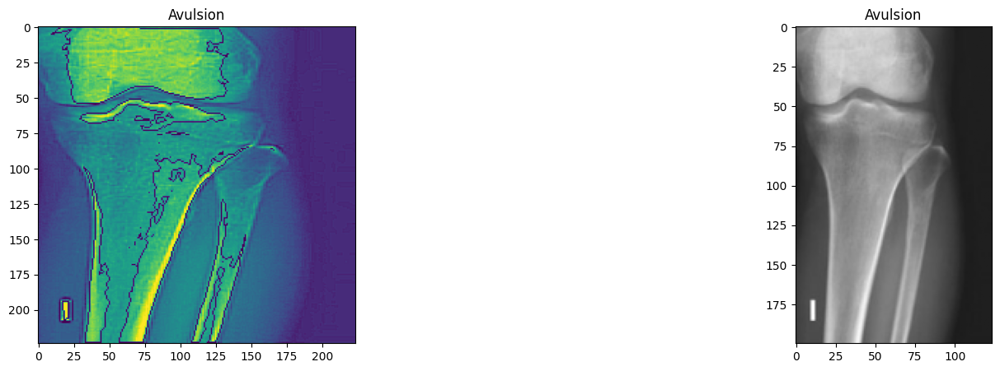

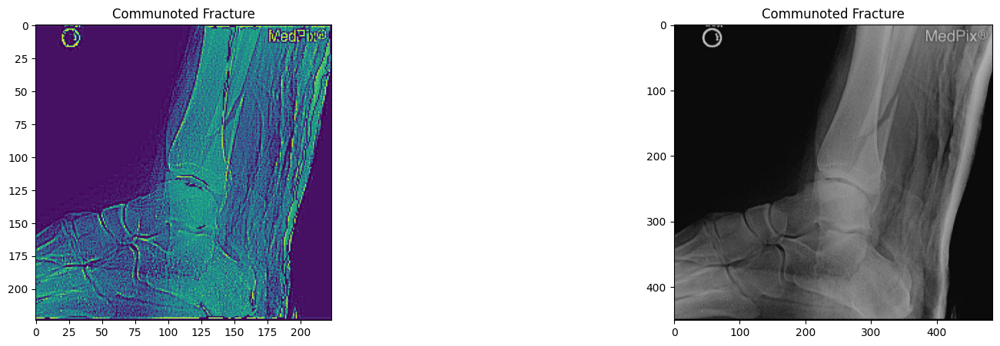

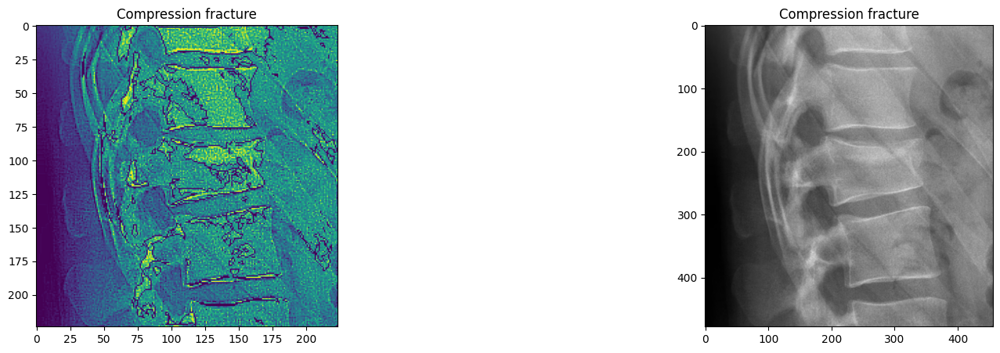

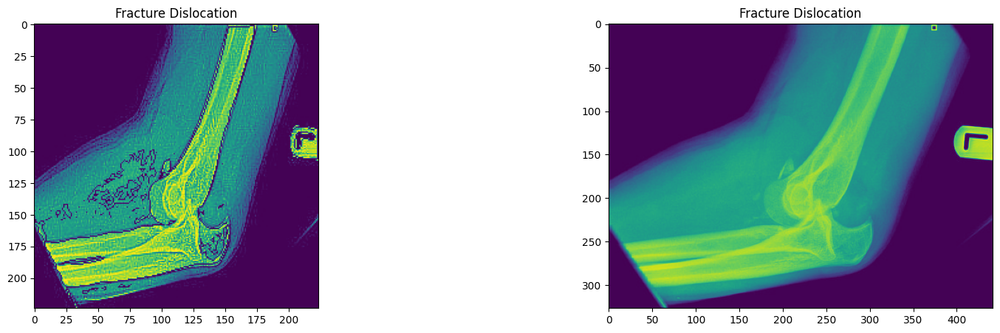

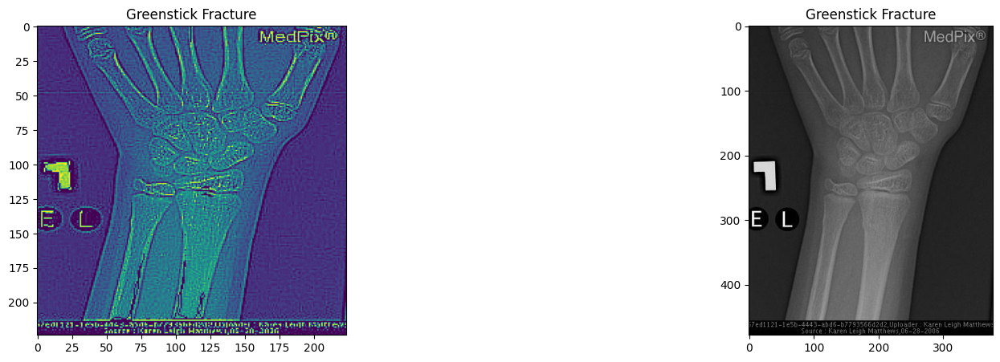

...

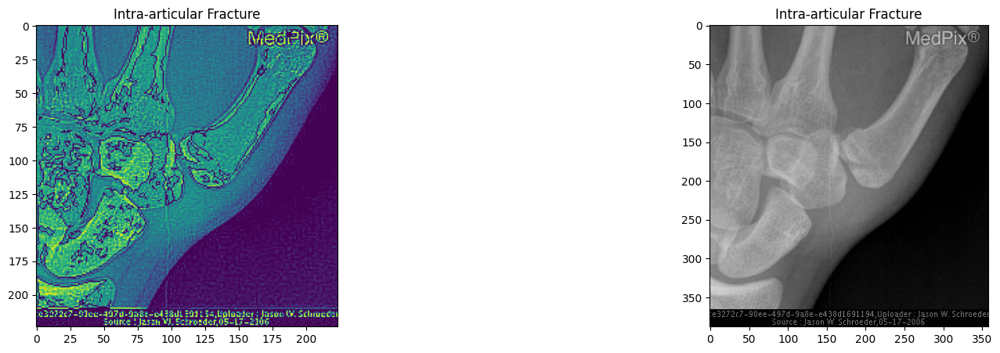

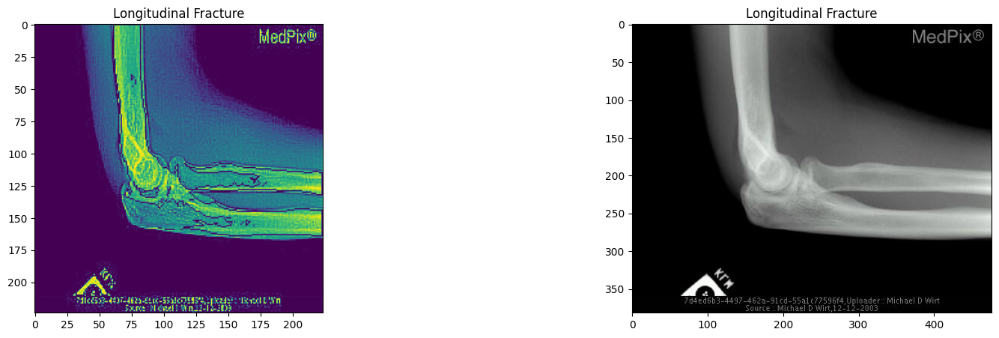

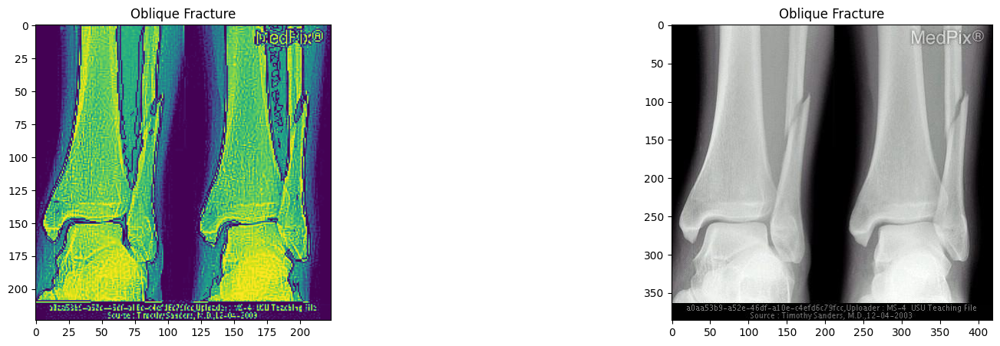

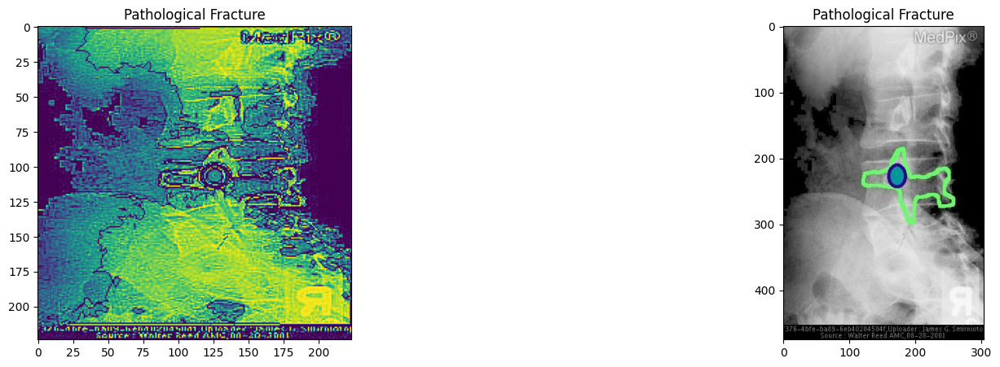

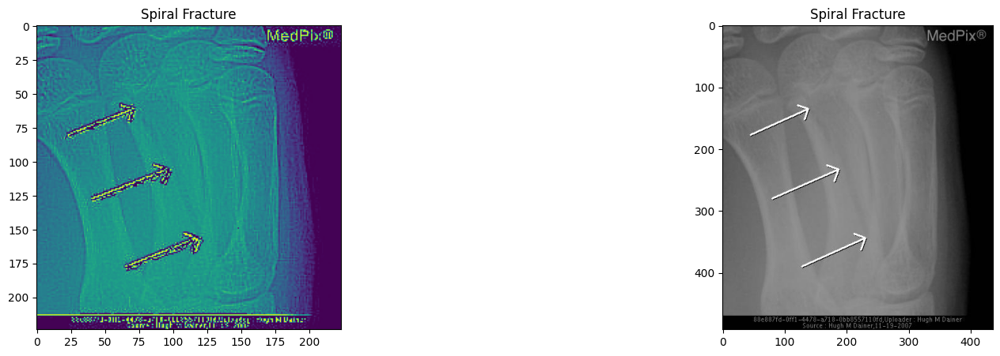

In [ ]:
dir_path_test = 'test/dataset_1_resized/dataset_1_bgr/dataset_1/'
dir_path_test1 = 'dataset_1/'

x = 20
y = 5

fileName = "Avulsion Fracture/001.png"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Avulsion')
axs[1].imshow(image2)
axs[1].set_title('Avulsion')

fileName = "Comminuted fracture/001.png"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Communoted Fracture')
axs[1].imshow(image2)
axs[1].set_title('Communoted Fracture')

fileName = "Compression fracture/004.png"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Compression fracture')
axs[1].imshow(image2)
axs[1].set_title('Compression fracture')

fileName = "Fracture Dislocation/002.jpeg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Fracture Dislocation')
axs[1].imshow(image2)
axs[1].set_title('Fracture Dislocation')

fileName = "Greenstick Fracture/012.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Greenstick Fracture')
axs[1].imshow(image2)
axs[1].set_title('Greenstick Fracture')

fileName = "Impacted Fracture/004.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Impacted Fracture')
axs[1].imshow(image2)
axs[1].set_title('Impacted Fracture')

fileName = "Intra-articular Fracture/004.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Intra-articular Fracture')
axs[1].imshow(image2)
axs[1].set_title('Intra-articular Fracture')

fileName = "Longitudinal Fracture/025.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Longitudinal Fracture')
axs[1].imshow(image2)
axs[1].set_title('Longitudinal Fracture')

fileName = "Oblique Fracture/049.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Oblique Fracture')
axs[1].imshow(image2)
axs[1].set_title('Oblique Fracture')

fileName = "Pathological Fracture/031.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Pathological Fracture')
axs[1].imshow(image2)
axs[1].set_title('Pathological Fracture')

fileName = "Spiral Fracture/037.jpg"
path1 = dir_path_test + fileName
path2 = dir_path_test1 + fileName
image1 = mpimg.imread(path1)
image2 = mpimg.imread(path2)
fig, axs = plt.subplots(1, 2, figsize=(x, y))
axs[0].imshow(image1)
axs[0].set_title('Spiral Fracture')
axs[1].imshow(image2)
axs[1].set_title('Spiral Fracture')